# NDVI Signal Analysis version 2
### Authors:
-  Selene Ledain (selene.ledain@ibm.com)
- Emine Didem Durukan (emine.didem.durukan@ibm.com)

Content:
1. Filter data to remove clouds, and chose the pixels that are forest in the regions where we know there was a drought.
2. Compare NDVI over summers of different years using several visualisation techniques and statistical tests.


## To-Do for v2 :
1. Data Removal check (selene)
    - line plots
    - more robust way to chose cloud threshold (check also literature)
    - time series decomposion
    - maps
2. Cloud analysis (didem)
    - count the number of cloudy pixels per time-steps, see how cloud changes over time
3. Find a nice and droughty ndvi signal, comparison (didem)


In [1]:
import os
import pandas as pd
from datetime import datetime
import dateutil
import geopandas as gpd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import numpy as np
#from osgeo import gdal
import rasterio
from rasterio.windows import from_bounds
import pickle
import re
import itertools
#import statsmodels 
#import statsmodels.api as sm
from scipy import signal
from scipy import stats
import warnings
from IPython import display
#import contextily as cx
from shapely import wkt
warnings.filterwarnings("ignore")

In [2]:
data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'


1. Normal (Non-Drought) => Above 0 (NDVI anomaly values %)
2. Mild Drought => 0 to -10 (NDVI anomaly values %)
3. Moderate Drought => -10 to -25 (NDVI anomaly values %)
4. Severe Drought => -25 to -50 (NDVI anomaly values %)
5. Very Severe Drought => Below -50 (NDVI anomaly values %)

In [3]:
## A region where there was high impact according to Brun, et.al paper. Region can be seen in the figure below
#bbox = [7.2588, 47.1866, 7.3673, 47.2931] # moutier area
bbox = [7.3662, 47.2000, 7.4033, 47.2200]  # grechenberg

# 0 - Prepare the data

## 0.1 - Keep only folders for Jura and that are complete

In [4]:
complete_folders = []
cp_folders = [] # folders that mainly have cloud probability
for folder in os.listdir(data_path):
    if "46.907_7.137_47.407_7.637" in folder:
        filelist = [file for file in os.listdir(data_path+'/'+folder) if file.endswith('.tiff')]
        if len(filelist)<=6: #cp, msi, ndmi, ndwi, ndvire. Most cp folders have 5 tiffs, but b03 downloaded with that bunch too so there is a folder with 6 tiffs
            cp_folders += [folder]
        if len(filelist)>6:
            complete_folders += [folder]

# 2 - Analysis with data removal
- Focus on a small region where drought occured (according to Brun et al.)
- Perform data removal to observe how NDVI signal changes
    - change cloud probability threshold
    
    
TO DO:
- plot patch/bounds
- create spatial plots and pipeline for computing different years + saving

## 2.1 Area of study

In [5]:
# Region selected based on study by Brun et al: Figure 3a
bbox_moutier = [7.2588, 47.1866, 7.3673, 47.2931]  
bbox_grench = [7.3662, 47.2000, 7.4033, 47.2200] #grenchenberg
bbox_valais = [7.087,46.1437,7.444,46.3078] # South facing slope between Martigny and Sion
bbox_valais2 = [7.244, 46.212, 7.3683,46.2778]
bbox = bbox_grench

Text(15.972222222222216, 0.5, 'lat')

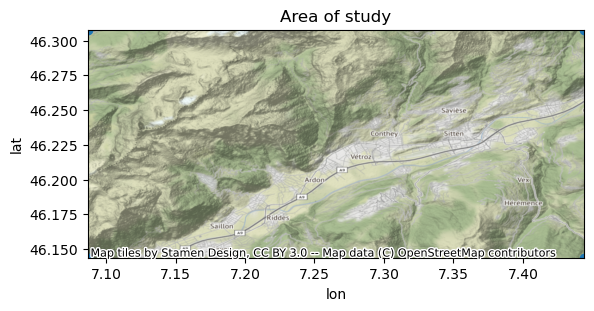

In [4]:
# Plot patch using bounds of raster/bbox and contextily
#corners_wkt = gpd.GeoSeries(['POINT(7.2588 47.1866)','POINT(7.3673 47.1866)', 'POINT(7.2588 47.2931)','POINT(7.3673 47.2931)'])
#corners_wkt = gpd.GeoSeries(['POINT(7.3662 47.2000)','POINT(7.4033 47.2000)', 'POINT(7.3662 47.2200)','POINT(7.4033 47.2200)'])
corners_wkt = gpd.GeoSeries(['POINT(7.087 46.1437)','POINT(7.444 46.1437)', 'POINT(7.087 46.3078)','POINT(7.444 46.3078)'])
df_corners = pd.DataFrame()
df_corners['corners_wkt'] = corners_wkt
df_corners['geometry'] = df_corners['corners_wkt'].apply(wkt.loads)
gdf_corners = gpd.GeoDataFrame(df_corners.drop('corners_wkt', axis=1))

ax = gdf_corners.plot()
cx.add_basemap(ax, crs='EPSG:4326')
#ax.set_ylim(47.1866, 47.2931)
#ax.set_xlim(7.2588, 7.3673)
#ax.set_ylim(47.2000, 47.2200)
#ax.set_xlim(7.3662, 7.4033)
ax.set_ylim(46.1437, 46.3078)
ax.set_xlim(7.087, 7.444)
plt.title('Area of study')
plt.xlabel('lon')
plt.ylabel('lat')

Text(24.847222222222214, 0.5, 'lat')

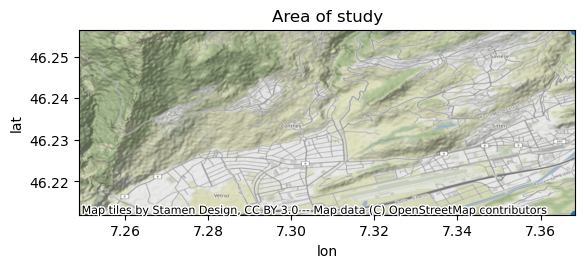

In [5]:
# Plot patch using bounds of raster/bbox and contextily
bbox_valais2 = [7.244, 46.212, 7.3683,46.2778]
corners_wkt = gpd.GeoSeries(['POINT(7.244 46.212)','POINT(7.3683 46.212)', 'POINT(7.244 46.2565)','POINT(7.3683 46.2565)'])
df_corners = pd.DataFrame()
df_corners['corners_wkt'] = corners_wkt
df_corners['geometry'] = df_corners['corners_wkt'].apply(wkt.loads)
gdf_corners = gpd.GeoDataFrame(df_corners.drop('corners_wkt', axis=1))

ax = gdf_corners.plot()
cx.add_basemap(ax, crs='EPSG:4326')
ax.set_ylim(46.212, 46.2565)
ax.set_xlim(7.249, 7.3683)
plt.title('Area of study')
plt.xlabel('lon')
plt.ylabel('lat')

## 2.2 Collect data

Variables:
- threshold for forest ratio per pixel
- cloud probability threshold

Plot as maps

In [107]:
forest_threshold = 0.95 #ratio of forest per pixel
cp_thresh = 30 #%. Drop pixel if more than threshold proba of being cloud

#### Create binary forest mask using threshold

In [8]:
forest_mask = '/dccstor/cimf/drought_impact/downloads/forest_mask/46.907_7.137_47.407_7.637/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
if bbox is not None:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print(for_arr.shape)
else:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1)

for_arr[for_arr==-9999] = np.nan

# Make binary mask keeping only pixels that are >50% forest
forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<forest_threshold]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

(78, 144)


#### Get coordinates of forest pixels in bbox

In [9]:
# Get coordinates of forest pixel in bbox

with rasterio.open(forest_mask) as src:
    im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print('shape of bbox:', for_arr.shape)
    height = for_arr.shape[0]
    width = for_arr.shape[1]
    bbox_transform = rasterio.transform.from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], width, height)
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(bbox_transform, rows, cols)
    lons = np.concatenate(xs).ravel()
    lats = np.concatenate(ys).ravel()

"""
# If getting all pixel coords and not only forest
df_coords = pd.DataFrame()
for i in range(len(xs)):
    lons = xs[i]
    lats = ys[i]
    df_coords = df_coords.append(pd.DataFrame({'lons':lons, 'lats':lats}), ignore_index=True)
"""
    
# Select forest pixels
forest_indices = np.where(forest_binary.flatten() == True)
row_pixs = forest_indices[0]
col_pixs = forest_indices[0]
lons = lons[col_pixs]
lats = lats[row_pixs]

df_coords = pd.DataFrame({'lons':lons, 'lats': lats})

# Create point geometries
gdf = gpd.GeoDataFrame(df_coords, geometry=gpd.points_from_xy(df_coords['lons'], df_coords['lats']), crs="EPSG:4326")
gdf.head()

shape of bbox: (78, 144)


,lons,lats,geometry
0,7.366329,47.219872,POINT (7.36633 47.21987)
1,7.366586,47.219872,POINT (7.36659 47.21987)
2,7.366844,47.219872,POINT (7.36684 47.21987)
3,7.367102,47.219872,POINT (7.36710 47.21987)
4,7.367359,47.219872,POINT (7.36736 47.21987)


#### Get NDVI values (June-Sep, masking forest and clouds)

In [10]:
data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
df_NDVI = pd.DataFrame()

for folder in os.listdir(data_path):
    if folder in complete_folders: 
        timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
        if timestamp.month>=6 and timestamp.month<=9:
            for file in os.listdir(data_path + '/' + folder):
                
                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
                
            # Mask out forest, clouds and -9999 (as nan)
            ndvi[ndvi == -9999] = np.nan
            ndvi[cloud>=cp_thresh] = np.nan
            #print('beofre', np.isnan(ndvi[forest_binary]).sum())
            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'coords':gdf['geometry']})
            # # Drop nan values 
            #print('afeetr', df_file.ndvi.isna().sum())
            df_file = df_file.dropna(axis=0)
            
            df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

In [11]:
df_NDVI.sample(5)

,timestamp,ndvi,coords
481156,2018-07-24,0.8614,POINT (7.38488 47.20782)
391856,2017-08-23,0.8644,POINT (7.38256 47.21474)
440127,2016-09-02,0.7804,POINT (7.37663 47.20654)
258362,2017-06-19,0.9022,POINT (7.39312 47.20654)
147467,2021-08-12,0.8811,POINT (7.39647 47.20808)


#### Plot filtered pixels: by forest AND by cloud probability

### Compute data dropping rates depening on CP threshold

In [6]:
bbox = bbox_grench

In [7]:
# CREATE FOREST MASK AND GET COORDINATES OF FOREST PIXELS

forest_threshold = 0.95 #ratio of forest per pixel

# Create forest mask
forest_mask = '/dccstor/cimf/drought_impact/downloads/forest_mask/46.907_7.137_47.407_7.637/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
if bbox is not None:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print(for_arr.shape)
else:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1)

for_arr[for_arr==-9999] = np.nan

# Make binary mask keeping only pixels that are >50% forest
forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<forest_threshold]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

# Get coordinates of forest pixel in bbox
with rasterio.open(forest_mask) as src:
    im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print('shape of bbox:', for_arr.shape)
    height = for_arr.shape[0]
    width = for_arr.shape[1]
    bbox_transform = rasterio.transform.from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], width, height)
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(bbox_transform, rows, cols)
    lons = np.concatenate(xs).ravel()
    lats = np.concatenate(ys).ravel()

# Select forest pixels
forest_indices = np.where(forest_binary.flatten() == True)
row_pixs = forest_indices[0]
col_pixs = forest_indices[0]
lons = lons[col_pixs]
lats = lats[row_pixs]

df_coords = pd.DataFrame({'lons':lons, 'lats': lats})

# Create point geometries
gdf = gpd.GeoDataFrame(df_coords, geometry=gpd.points_from_xy(df_coords['lons'], df_coords['lats']), crs="EPSG:4326")

(78, 145)
shape of bbox: (78, 145)


In [8]:
def get_ndvi_cp(complete_folders, cp_thresh, gdf, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param complete_folders: list of folders to read from
    :param cp_thresh: cloud proba threshold. Drop measurement if its proba is above 
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if folder in complete_folders: 
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            if timestamp.month>=6 and timestamp.month<=9:
                for file in os.listdir(data_path + '/' + folder):

                    ndvi_search = '\[' +  'NDVI' + '\]'
                    CP_search = '\[' +  'CP' + '\]'

                    if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                    if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                # Mask out forest, clouds and -9999 (as nan)
                cloud[cloud == -9999]=np.nan
                ndvi[ndvi == -9999] = np.nan
                ndvi[cloud>=cp_thresh] = np.nan
                #print('beofre', np.isnan(ndvi[forest_binary]).sum())
                df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten(),'coords':gdf['geometry']})
                # # Drop nan values 
                #print('afeetr', df_file.ndvi.isna().sum())
                df_file = df_file.dropna(axis=0)

                df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [ ]:
cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
num_data =  np.empty((len(cp_thresholds)))

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp(complete_folders, cp, gdf, forest_binary, bbox)
    num_data[i] = len(df_NDVI)

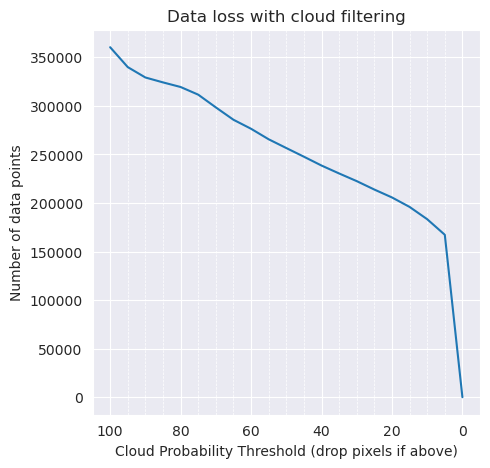

In [146]:
# Plot the change in data
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.lineplot(ax=ax, x=cp_thresholds, y=num_data)
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
sns.set_style("darkgrid")
plt.show()

In [156]:
# Compute change per year

cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
cnt_per_yr = pd.DataFrame()

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp(complete_folders, cp, gdf, forest_binary, bbox)
    # Count per year
    gb_yr = df_NDVI.groupby(df_NDVI['timestamp'].map(lambda x: x.year)).count().ndvi.reset_index()
    # Add column for cp
    gb_yr['cp'] = [cp]*len(gb_yr)
    # Add to cnt_per_yr (append row wise)
    cnt_per_yr = pd.concat([cnt_per_yr, gb_yr], axis=0, ignore_index=True)
    
df_NDVI_tmp = get_ndvi_cp(complete_folders, 10, gdf, forest_binary, bbox)
yrs = np.unique(df_NDVI_tmp['timestamp'].map(lambda x: x.year))
cnt_per_yr_0 = pd.DataFrame({'timestamp': yrs, 'ndvi':[0]*len(yrs), 'cp':[0]*len(yrs)})
cnt_per_yr =  pd.concat([cnt_per_yr, cnt_per_yr_0], axis=0, ignore_index=True)

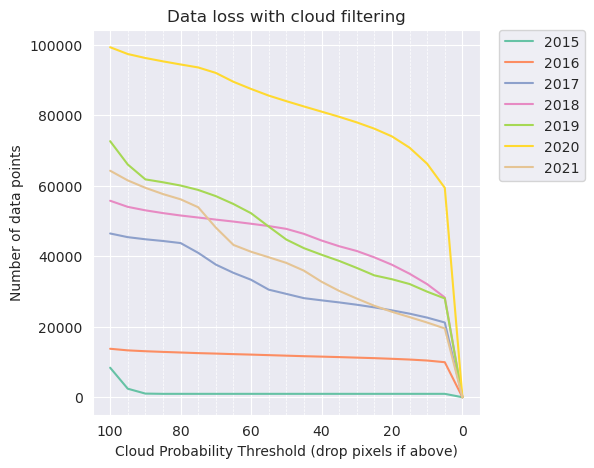

In [157]:
# Plot the change in data, per year
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.set_style("darkgrid")
sns.lineplot(ax=ax, x='cp', y='ndvi', hue='timestamp', data=cnt_per_yr, palette="Set2")
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

### Compute dropping rates for 1000 random pixels in Jura

In [9]:
# Get 1000 random locations in Jura data

forest_mask = '/dccstor/cimf/drought_impact/downloads/forest_mask/46.907_7.137_47.407_7.637/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
with rasterio.open(forest_mask) as src:
    for_arr = src.read(1) # should be same resolution and extent as Sen 2 data ideally
for_arr[for_arr==-9999] = np.nan

forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<0.95]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

with rasterio.open(forest_mask) as src:
    band1 = src.read(1)
    height = band1.shape[0]
    width = band1.shape[1]
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(src.transform, rows, cols)
    lons = np.array(xs)[0,:]
    lats = np.array(ys)[:,0]
    
# Select forest pixels
row_col_idx = np.where(forest_binary == True)#[0]
# Randomly choose 1000 indices
for_pixs = np.random.randint(0, len(row_col_idx[0]), size=1000)
row_pixs = row_col_idx[0][for_pixs]
col_pixs = row_col_idx[1][for_pixs]
lons = lons[col_pixs]
lats = lats[row_pixs]
df = pd.DataFrame({'col_pixs': col_pixs, 'row_pixs': row_pixs, 'lons':lons, 'lats': lats})

In [10]:
# Create point geometries
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lons'], df['lats']), crs="EPSG:4326")
gdf.head()

,col_pixs,row_pixs,lons,lats,geometry
0,1264,360,7.459712,47.316224,POINT (7.45971 47.31622)
1,101,995,7.161984,47.153664,POINT (7.16198 47.15366)
2,962,1852,7.382400,46.934272,POINT (7.38240 46.93427)
3,1333,475,7.477376,47.286784,POINT (7.47738 47.28678)
4,1569,274,7.537792,47.338240,POINT (7.53779 47.33824)


In [11]:
def get_ndvi_cp_random(complete_folders, cp_thresh, gdf, forest_binary, bbox, for_pixs, row_pixs, col_pixs):
    """
    Get random NDVI pixels if cloud proba < cp_thresh, sampling only forest pixels using the forest mask
    :param complete_folders: list of folders to read from
    :param cp_thresh: cloud proba threshold. Drop measurement if its proba is above 
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param for_pixs: forest pixels to sample
    :param row_pixs: row indices
    :param col_pixs: col_indices
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if folder in complete_folders: 
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            #if timestamp.month>=6 and timestamp.month<=9:
            for file in os.listdir(data_path + '/' + folder):

                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1)
                        ndvi_sample = np.array([ndvi[row_pixs[i],col_pixs[i]] for i in range(len(for_pixs))])

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cp = src.read(1)
                        cp_sample = [cp[row_pixs[i],col_pixs[i]] for i in range(len(for_pixs))]

            # Mask out forest, clouds and -9999 (as nan)
            cp_sample[cp_sample == -9999] = np.nan
            ndvi_sample[ndvi_sample == -9999] = np.nan
            cp_filter = np.array((np.array(cp_sample)>=cp_thresh))
            ndvi_sample[cp_filter] = np.nan

            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi_sample.flatten()), 'ndvi': ndvi_sample, 'cp':cp_sample,'coords':gdf['geometry']})
            # Drop nan values
            df_file = df_file.dropna(axis=0)

            df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [ ]:
cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
num_data =  np.empty((len(cp_thresholds)))

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp_random(complete_folders, cp, gdf, forest_binary, bbox, for_pixs, row_pixs, col_pixs)
    num_data[i] = len(df_NDVI)
    
# Plot the change in data
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.set_style("darkgrid")
sns.lineplot(ax=ax, x=cp_thresholds, y=num_data)
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
plt.savefig(f'ndvi_plots/data_loss_cp_jura.png')
plt.show()

In [ ]:
# Compute change per year

cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
cnt_per_yr = pd.DataFrame()

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp_random(complete_folders, cp, gdf, forest_binary, bbox, for_pixs, row_pixs, col_pixs)
    # Count per year
    gb_yr = df_NDVI.groupby(df_NDVI['timestamp'].map(lambda x: x.year)).count().ndvi.reset_index()
    # Add column for cp
    gb_yr['cp'] = [cp]*len(gb_yr)
    # Add to cnt_per_yr (append row wise)
    cnt_per_yr = pd.concat([cnt_per_yr, gb_yr], axis=0, ignore_index=True)
    
df_NDVI_tmp = get_ndvi_cp_random(complete_folders, 10, gdf, forest_binary, bbox, for_pixs, row_pixs, col_pixs)
yrs = np.unique(df_NDVI_tmp['timestamp'].map(lambda x: x.year))
cnt_per_yr_0 = pd.DataFrame({'timestamp': yrs, 'ndvi':[0]*len(yrs), 'cp':[0]*len(yrs)})
cnt_per_yr =  pd.concat([cnt_per_yr, cnt_per_yr_0], axis=0, ignore_index=True)

In [ ]:
# Plot the change in data, per year
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.lineplot(ax=ax, x='cp', y='ndvi', hue='timestamp', data=cnt_per_yr, palette="Set2")
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
sns.set_style("darkgrid")
plt.savefig(f'ndvi_plots/data_loss_peryear_cp_jura.png')
plt.show()

#### Plot stats for different years

In [12]:
# Extract data on time
df_NDVI['year'] = df_NDVI.timestamp.apply(lambda x: x.year)
df_NDVI['day'] = df_NDVI.timestamp.apply(lambda x: x.dayofyear)
df_NDVI['month'] = df_NDVI.timestamp.apply(lambda x: x.month)
#df_NDVI['week'] = df_NDVI.ts.apply(lambda x: x.week)

#### Plot spatially

In [13]:
# Group by location and calculate mean and std per year
gdf_NDVI = gpd.GeoDataFrame(df_NDVI, geometry='coords')
gdf_NDVI['geometry_wkt'] = gdf_NDVI['coords'].apply(lambda x: x.wkt)
means = gdf_NDVI[['year', 'geometry_wkt', 'ndvi']].groupby(['year', 'geometry_wkt']).mean().reset_index()
sds = gdf_NDVI[['year', 'geometry_wkt', 'ndvi']].groupby(['year', 'geometry_wkt']).std().reset_index()

In [14]:
# Convert the 'wkt' column to a 'geometry' column
means['geometry'] = means['geometry_wkt'].apply(wkt.loads)
means = gpd.GeoDataFrame(means.drop('geometry_wkt', axis=1), geometry='geometry')

sds['geometry'] = sds['geometry_wkt'].apply(wkt.loads)
sds = gpd.GeoDataFrame(sds.drop('geometry_wkt', axis=1), geometry='geometry')

In [33]:
forest_threshold = 1

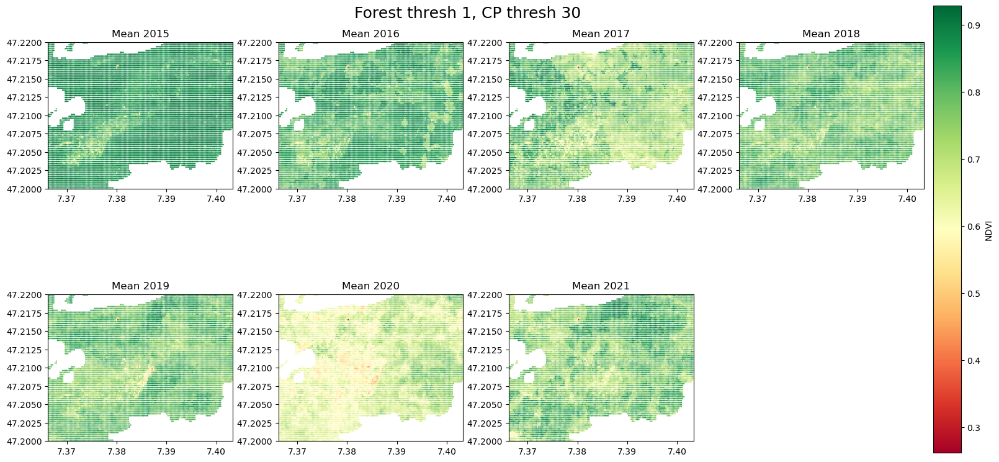

In [34]:
# Plot
means = means.set_crs('epsg:4326')
years = np.unique(means.year)

plt.figure(figsize=(15, 9))
plt.suptitle(f'Forest thresh {forest_threshold}, CP thresh {cp_thresh}', fontsize=18, y=0.9)

vmin = means.ndvi.min()
vmax = means.ndvi.max()

for i, yr in enumerate(years):
    ax = plt.subplot(2,4, i+1) 
    means[means.year==yr].plot(ax=ax, column='ndvi', cmap='RdYlGn', vmin=vmin, vmax=vmax, markersize=0.5) 
    #cx.add_basemap(ax, crs='EPSG:4326')
    #ax.set_ylim(47.1866, 47.2931)
    #ax.set_xlim(7.2588, 7.3673)
    ax.set_ylim(47.2000, 47.2200)
    ax.set_xlim(7.3662, 7.4033)
    ax.set_title(f'Mean {yr}')

# Add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("NDVI", size=10)
plt.savefig(f'ndvi_plots/f{forest_threshold}_cp{cp_thresh}_means_grench.png')
plt.tight_layout()
plt.show()

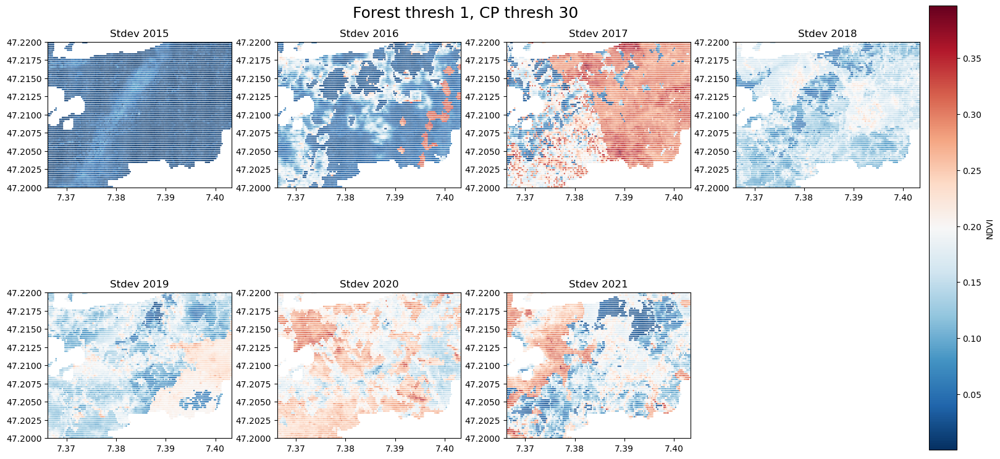

In [35]:
# Plot
sds = sds.set_crs('epsg:4326')
years = np.unique(sds.year)

plt.figure(figsize=(15, 9))
plt.suptitle(f'Forest thresh {forest_threshold}, CP thresh {cp_thresh}', fontsize=18, y=0.9)

vmin = sds.ndvi.min()
vmax = sds.ndvi.max()

for i, yr in enumerate(years):
    ax = plt.subplot(2,4, i+1) 
    sds[sds.year==yr].plot(ax=ax, column='ndvi', cmap='RdBu_r', vmin=vmin, vmax=vmax, markersize=0.5) 
    #ax.set_ylim(47.1866, 47.2931)
    #ax.set_xlim(7.2588, 7.3673)
    ax.set_ylim(47.2000, 47.2200)
    ax.set_xlim(7.3662, 7.4033)
    ax.set_title(f'Stdev {yr}')

# Add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("NDVI", size=10)
plt.savefig(f'ndvi_plots/f{forest_threshold}_cp{cp_thresh}_sds_grench.png')
plt.tight_layout()
plt.show()

#### Plotting anomalies/variations from mean
- subtract mean of all years to NDVI value

### Plotting outliers
- subtract mean and divide by std
- plot only those +/- 1?

In [36]:
gdf_NDVI = gpd.GeoDataFrame(df_NDVI, geometry='coords')
gdf_NDVI['geometry_wkt'] = gdf_NDVI['coords'].apply(lambda x: x.wkt)

In [37]:
yearly_means = gdf_NDVI.groupby('year').ndvi.mean()
yearly_sds = gdf_NDVI.groupby('year').ndvi.std()

In [38]:
# Compute mean z scores per location
df_z = pd.DataFrame()
for yr in years:
    data = gdf_NDVI[gdf_NDVI.year==yr]
    data['ndvi'] = data['ndvi'].apply(lambda x: (x-yearly_means[yr])/yearly_sds[yr])
    coords = data[['geometry_wkt', 'coords']].sort_values('geometry_wkt').drop_duplicates('geometry_wkt', keep='first').coords.reset_index()
    mean_zscore_per_loc = data.groupby(['geometry_wkt']).mean().ndvi.reset_index()
    mean_zscore_per_loc['coords'] = coords['coords']
    mean_zscore_per_loc['year'] = [yr]*len(mean_zscore_per_loc)
    df_z = df_z.append(mean_zscore_per_loc)
    
gdf_z = gpd.GeoDataFrame(df_z, geometry='coords')

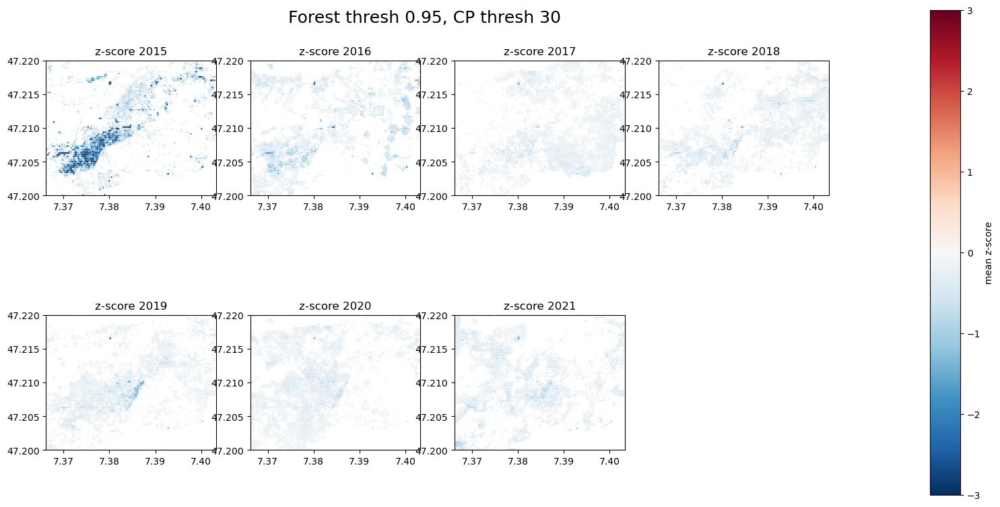

In [27]:
# Plot
gdf_NDVI = gdf_NDVI.set_crs('epsg:4326')
years = np.unique(gdf_NDVI.year)

plt.figure(figsize=(15, 9))
plt.suptitle(f'Forest thresh {forest_threshold}, CP thresh {cp_thresh}', fontsize=18, y=0.9)

    
# Vmax , min should be of all zscores across years
vmin = -3 #gdf_z.ndvi.min()
vmax = 3 #gdf_z.ndvi.max()

for i, yr in enumerate(years):
    ax = plt.subplot(2,4, i+1) 
    """
    # Plot if occurence of outlier zscore at any moment
    data = gdf_NDVI[gdf_NDVI.year==yr]
    data['ndvi'] = data['ndvi'].apply(lambda x: (x-yearly_means[yr])/yearly_sds[yr])
    data = data[(data.ndvi>=1) | (data.ndvi<-1)] 
    """
    # Plot if mean szcore at location is outlier
    data = gdf_z[gdf_z.year==yr]
    data = data[(data.ndvi<0)] 
    
    data.plot(ax=ax, column='ndvi', cmap='RdBu_r', vmin=vmin, vmax=vmax, markersize=0.5) 
    #cx.add_basemap(ax, crs='EPSG:4326')
    #ax.set_ylim(47.1866, 47.2931)
    #ax.set_xlim(7.2588, 7.3673)
    ax.set_ylim(47.2000, 47.2200)
    ax.set_xlim(7.3662, 7.4033)
    ax.set_title(f'z-score {yr}')

# Add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("mean z-score", size=10)
plt.savefig(f'ndvi_plots/f{forest_threshold}_cp{cp_thresh}_zscores_grench.png')
plt.show()

In [39]:
# Compute means 2015-2017

pre_mean = gdf_NDVI[gdf_NDVI.year.isin([2015,2016])].ndvi.mean()
pre_sd = gdf_NDVI[gdf_NDVI.year.isin([2015,2016])].ndvi.std()


data = gdf_NDVI.copy()
data['ndvi'] = data['ndvi'].apply(lambda x: (x-pre_mean)/pre_sd)
coords = data[['geometry_wkt', 'coords']].sort_values('geometry_wkt').drop_duplicates('geometry_wkt', keep='first').coords.reset_index()
mean_zscore_per_loc = data.groupby(['geometry_wkt']).mean().ndvi.reset_index()
mean_zscore_per_loc['coords'] = coords['coords']
#mean_zscore_per_loc['year'] = [yr]*len(mean_zscore_per_loc)
gdf_z = gpd.GeoDataFrame(data, geometry='coords')

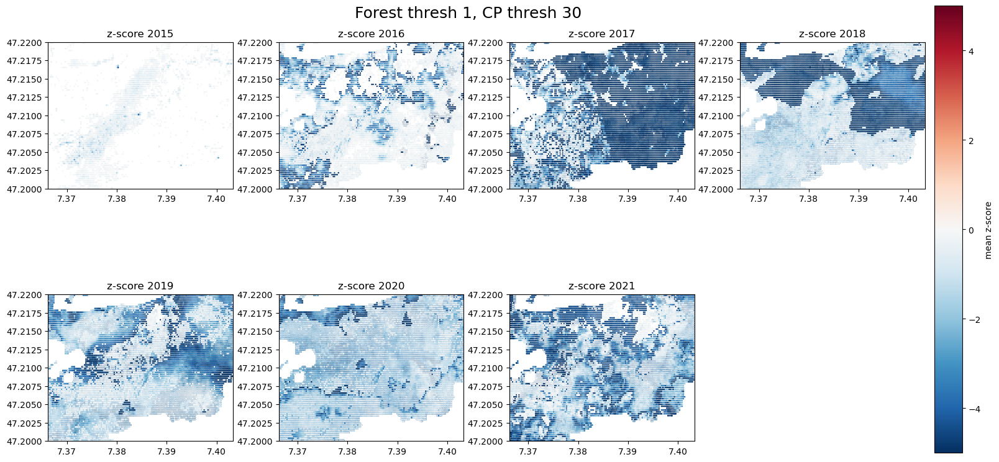

In [40]:
# Plot USING MEAN OF 2015-2017
gdf_z = gdf_z.set_crs('epsg:4326')
years = np.unique(gdf_z.year)

plt.figure(figsize=(15, 9))
plt.suptitle(f'Forest thresh {forest_threshold}, CP thresh {cp_thresh}', fontsize=18, y=0.9)

    
# Vmax , min should be of all zscores across years
vmin = -5 #gdf_z.ndvi.min()
vmax = 5 #gdf_z.ndvi.max()

for i, yr in enumerate(years):
    ax = plt.subplot(2,4, i+1) 
    """
    # Plot if occurence of outlier zscore at any moment
    data = gdf_NDVI[gdf_NDVI.year==yr]
    data['ndvi'] = data['ndvi'].apply(lambda x: (x-yearly_means[yr])/yearly_sds[yr])
    data = data[(data.ndvi>=1) | (data.ndvi<-1)] 
    """
    # Plot if mean szcore at location is outlier
    data = gdf_z[gdf_z.year==yr]
    data = data[(data.ndvi<0)] 
    
    data.plot(ax=ax, column='ndvi', cmap='RdBu_r', vmin=vmin, vmax=vmax, markersize=0.5) 
    #cx.add_basemap(ax, crs='EPSG:4326')
    #ax.set_ylim(47.1866, 47.2931)
    #ax.set_xlim(7.2588, 7.3673)
    ax.set_ylim(47.2000, 47.2200)
    ax.set_xlim(7.3662, 7.4033)
    ax.set_title(f'z-score {yr}')

# Add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("mean z-score", size=10)
plt.savefig(f'ndvi_plots/f{forest_threshold}_cp{cp_thresh}_zscores_grench.png')
plt.tight_layout()
plt.show()

# 2.2 NDVI vs CP in Valais
- How does NDVI change with CP (aggregate and pixel wise)
- Does CP increase NDVI
- Determine threshold of CP

### NDVI vc CP (all year, all region Valais2)

In [3]:
def get_ndvi_at_cp(coords, cp_thresh, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Keep if cp==cp_thresh
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            for file in os.listdir(data_path + '/' + folder):

                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

            # Mask out forest, clouds and -9999 (as nan)
            cloud[cloud == -9999] = np.nan
            ndvi[ndvi == -9999] = np.nan
            ndvi[cloud!=cp_thresh] = np.nan
            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten()}) #, 'coords':gdf['geometry']})
            df_file = df_file.dropna(axis=0)

            df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [6]:
# CREATE FOREST MASK AND GET COORDINATES OF FOREST PIXELS

bbox = bbox_valais2
coords = '46.000_7.02_46.372_7.435' # '46.907_7.137_47.407_7.637'  

forest_threshold = 0.95 #ratio of forest per pixel

# Create forest mask --> Use the one in valais!
forest_mask = f'/dccstor/cimf/drought_impact/downloads/forest_mask/{coords}/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
if bbox is not None:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
else:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1)

for_arr[for_arr==-9999] = np.nan

# Make binary mask keeping only pixels that are >50% forest
forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<forest_threshold]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

# Get coordinates of forest pixel in bbox
with rasterio.open(forest_mask) as src:
    im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print('shape of bbox:', for_arr.shape)
    height = for_arr.shape[0]
    width = for_arr.shape[1]
    bbox_transform = rasterio.transform.from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], width, height)
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(bbox_transform, rows, cols)
    lons = np.concatenate(xs).ravel()
    lats = np.concatenate(ys).ravel()

# Select forest pixels
forest_indices = np.where(forest_binary.flatten() == True)
row_pixs = forest_indices[0]
col_pixs = forest_indices[0]
lons = lons[col_pixs]
lats = lats[row_pixs]

df_coords = pd.DataFrame({'lons':lons, 'lats': lats})

# Create point geometries
gdf = gpd.GeoDataFrame(df_coords, geometry=gpd.points_from_xy(df_coords['lons'], df_coords['lats']), crs="EPSG:4326")

shape of bbox: (257, 485)


In [9]:
cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
#mean_ndvi = np.empty((len(cp_thresholds)))
med_ndvi = np.empty((len(cp_thresholds)))
coords = '46.000_7.02_46.372_7.435' #'46.907_7.137_47.407_7.637' 

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_at_cp(coords, cp, forest_binary, bbox_valais2)
    #mean_ndvi[i] = df_NDVI.ndvi.mean()
    med_ndvi[i] = df_NDVI.ndvi.median()

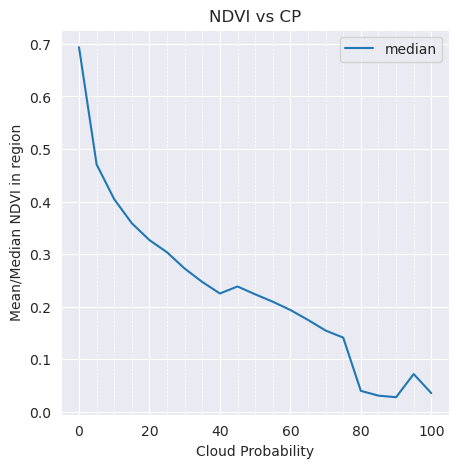

In [13]:
# Plot the change in data
fig, ax = plt.subplots(1,1, figsize=(5,5))
#sns.lineplot(ax=ax, x=cp_thresholds, y=mean_ndvi, label='mean')
sns.lineplot(ax=ax, x=cp_thresholds, y=med_ndvi, label='median')
ax.set_xlabel('Cloud Probability')
ax.set_ylabel('Mean/Median NDVI in region')
ax.set_title('NDVI vs CP')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
#plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
sns.set_style("darkgrid")
plt.show()

## NDVI vs CP only for summer (all region Valais2) 

In [14]:
def get_ndvi_at_cp_summer(coords, cp_thresh, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Keep if cp==cp_thresh
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            if timestamp.month>=6 and timestamp.month<=9:
                for file in os.listdir(data_path + '/' + folder):

                    ndvi_search = '\[' +  'NDVI' + '\]'
                    CP_search = '\[' +  'CP' + '\]'

                    if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                    if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                # Mask out forest, clouds and -9999 (as nan)
                cloud[cloud == -9999] = np.nan
                ndvi[ndvi == -9999] = np.nan
                ndvi[cloud!=cp_thresh] = np.nan
                df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten()}) #, 'coords':gdf['geometry']})
                df_file = df_file.dropna(axis=0)

                df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [15]:
#bbox_valais2 = [7.244, 46.212, 7.3683,46.2778]

# CREATE FOREST MASK AND GET COORDINATES OF FOREST PIXELS

bbox = bbox_valais2
coords = '46.000_7.02_46.372_7.435' # '46.907_7.137_47.407_7.637' 

forest_threshold = 0.95 #ratio of forest per pixel

# Create forest mask --> Use the one in valais!
forest_mask = f'/dccstor/cimf/drought_impact/downloads/forest_mask/{coords}/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'

if bbox is not None:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
else:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1)

for_arr[for_arr==-9999] = np.nan

# Make binary mask keeping only pixels that are >50% forest
forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<forest_threshold]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

# Get coordinates of forest pixel in bbox
with rasterio.open(forest_mask) as src:
    im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print('shape of bbox:', for_arr.shape)
    height = for_arr.shape[0]
    width = for_arr.shape[1]
    bbox_transform = rasterio.transform.from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], width, height)
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(bbox_transform, rows, cols)
    lons = np.concatenate(xs).ravel()
    lats = np.concatenate(ys).ravel()

# Select forest pixels
forest_indices = np.where(forest_binary.flatten() == True)
row_pixs = forest_indices[0]
col_pixs = forest_indices[0]
lons = lons[col_pixs]
lats = lats[row_pixs]

df_coords = pd.DataFrame({'lons':lons, 'lats': lats})

# Create point geometries
gdf = gpd.GeoDataFrame(df_coords, geometry=gpd.points_from_xy(df_coords['lons'], df_coords['lats']), crs="EPSG:4326")

shape of bbox: (257, 485)


In [16]:
cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
#mean_ndvi = np.empty((len(cp_thresholds)))
med_ndvi = np.empty((len(cp_thresholds)))
coords = '46.000_7.02_46.372_7.435' #'46.907_7.137_47.407_7.637' 

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_at_cp_summer(coords, cp, forest_binary, bbox_valais2)
    #mean_ndvi[i] = df_NDVI.ndvi.mean()
    med_ndvi[i] = df_NDVI.ndvi.median()

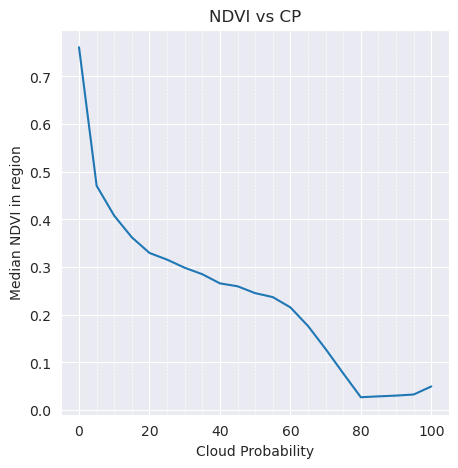

In [18]:
# Plot the change in data
fig, ax = plt.subplots(1,1, figsize=(5,5))
#sns.lineplot(ax=ax, x=cp_thresholds, y=mean_ndvi, label='mean')
sns.lineplot(ax=ax, x=cp_thresholds, y=med_ndvi) #, label='median') #, color='red')
ax.set_xlabel('Cloud Probability')
ax.set_ylabel('Median NDVI in region')
ax.set_title('NDVI vs CP')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
#plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
sns.set_style("darkgrid")
plt.show()

## NDVI vs CP for a single pixel in Valais2

In [50]:
def get_pixel_forest(bbox):
    # Create forest mask --> Use the one in valais!
    forest_mask = '/dccstor/cimf/drought_impact/downloads/forest_mask/46.000_7.02_46.372_7.435/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
    if bbox is not None:
        with rasterio.open(forest_mask) as src:
            im_forest = rasterio.open(forest_mask)
        for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    else:
        with rasterio.open(forest_mask) as src:
            im_forest = rasterio.open(forest_mask)
        for_arr = im_forest.read(1)

    for_arr[for_arr==-9999] = np.nan
    
    return for_arr

def get_pixel_comp(bbox):
    # 0 conifer, 1 broadleaf
    forest_comp = '/dccstor/cimf/drought_impact/downloads/ENV_DATA/46.000_7.02_46.372_7.435/Drought-Forest composition Switzerland[forest_comp]-01_01_2018T00_00_00.tiff'
    if bbox is not None:
        with rasterio.open(forest_comp) as src:
            im_forest = rasterio.open(forest_comp)
        for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    else:
        with rasterio.open(forest_comp) as src:
            im_forest = rasterio.open(forest_comp)
        for_arr = im_forest.read(1)

    for_arr[for_arr==-9999] = np.nan
    
    return for_arr

In [87]:
pix1 = [7.2602053, 46.2419499, 7.2607, 46.2423]
for_arr = get_pixel_forest(pix1)
for_comp = get_pixel_comp(pix1)
print(f'forest {for_arr[0]} comp {for_comp[0]}')

pix2 = [7.273485, 46.249400,7.273985, 46.2498]
for_arr = get_pixel_forest(pix2)
for_comp = get_pixel_comp(pix2)
print(f'forest {for_arr[0]} comp {for_comp[0]}')

"""
pix2 = [7.2648458, 46.2435949, 7.2653, 46.2440]
for_arr = get_pixel_forest(pix2)
for_comp = get_pixel_comp(pix2)
print(f'forest {for_arr[0]} comp {for_comp[0]}')

pix3 = [7.2820121, 46.25193119, 7.2825, 46.2523]
for_arr = get_pixel_forest(pix3)
for_comp = get_pixel_comp(pix3)
print(f'forest {for_arr[0]} comp {for_comp[0]}')

pix4 = [7.2676374, 46.2484113, 7.2681, 46.2488]
for_arr = get_pixel_forest(pix4)
for_comp = get_pixel_comp(pix4)
print(f'forest {for_arr[0]} comp {for_comp[0]}')
"""

forest [0.97528666] comp [97.47177]
forest [0.97527814] comp [0.]


"\npix2 = [7.2648458, 46.2435949, 7.2653, 46.2440]\nfor_arr = get_pixel_forest(pix2)\nfor_comp = get_pixel_comp(pix2)\nprint(f'forest {for_arr[0]} comp {for_comp[0]}')\n\npix3 = [7.2820121, 46.25193119, 7.2825, 46.2523]\nfor_arr = get_pixel_forest(pix3)\nfor_comp = get_pixel_comp(pix3)\nprint(f'forest {for_arr[0]} comp {for_comp[0]}')\n\npix4 = [7.2676374, 46.2484113, 7.2681, 46.2488]\nfor_arr = get_pixel_forest(pix4)\nfor_comp = get_pixel_comp(pix4)\nprint(f'forest {for_arr[0]} comp {for_comp[0]}')\n"

Text(265.9577463547157, 0.5, 'lat')

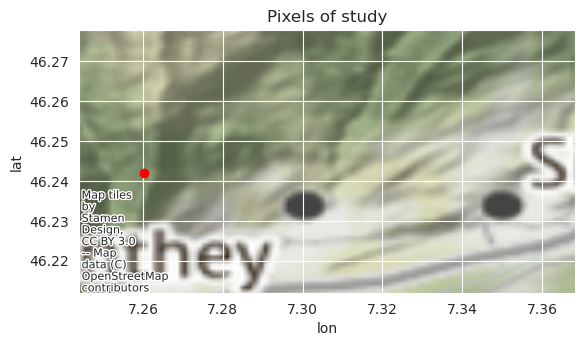

In [62]:
# Plot location in region of interest (Valais2)

corners_wkt = gpd.GeoSeries(['POINT(7.2602053 46.2419499)']) #,'POINT(7.2648458 46.2435949)', 'POINT(7.2820121 46.2435949)','POINT(7.2676374 46.2484113)'])
df_corners = pd.DataFrame()
df_corners['corners_wkt'] = corners_wkt
df_corners['geometry'] = df_corners['corners_wkt'].apply(wkt.loads)
gdf_corners = gpd.GeoDataFrame(df_corners.drop('corners_wkt', axis=1))

ax = gdf_corners.plot(color='red')
cx.add_basemap(ax, crs='EPSG:4326')
ax.set_ylim(46.212, 46.2778)
ax.set_xlim(7.244, 7.3683)
plt.title('Pixels of study')
plt.xlabel('lon')
plt.ylabel('lat')

In [66]:
# Get NDVI timeseries for each pixel

def get_pixel_ndvi(coords, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Keep if cp==cp_thresh
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            if timestamp.month>=6 or timestamp.month<=9:
                for file in os.listdir(data_path + '/' + folder):

                    ndvi_search = '\[' +  'NDVI' + '\]'
                    CP_search = '\[' +  'CP' + '\]'

                    if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                    if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                        with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                            cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                # Mask out forest, clouds and -9999 (as nan)
                cloud[cloud == -9999] = np.nan
                ndvi[ndvi == -9999] = np.nan
                #ndvi[cloud!=cp_thresh] = np.nan
                df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi.flatten()), 'ndvi': ndvi.flatten(), 'cp':cloud.flatten()}) #, 'coords':gdf['geometry']})
                df_file = df_file.dropna(axis=0)

                df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

Text(0.5, 1.0, 'Pixel NDVI timeseries 2020')

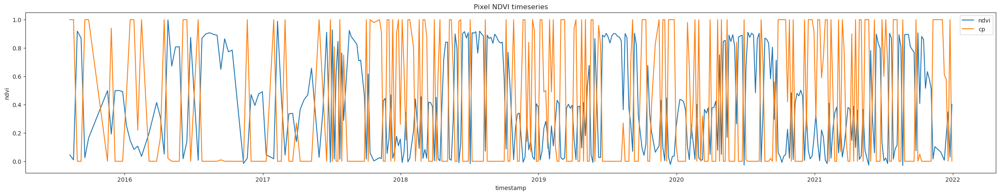

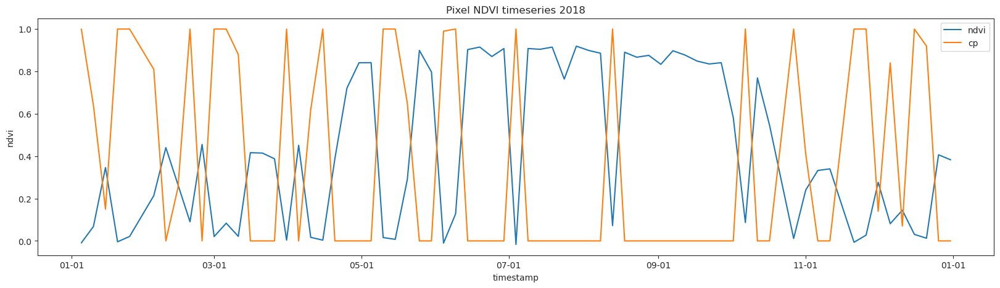

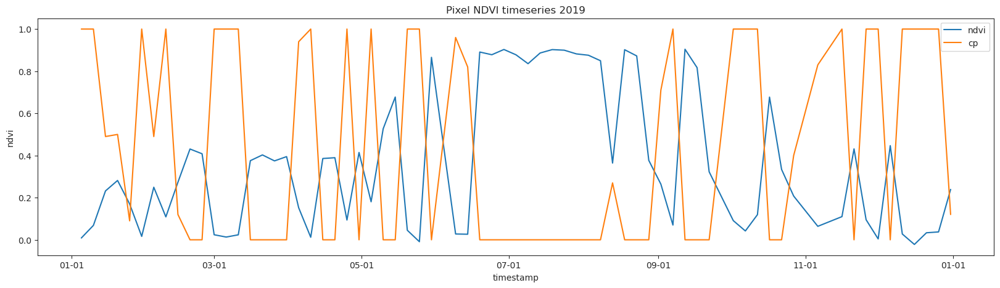

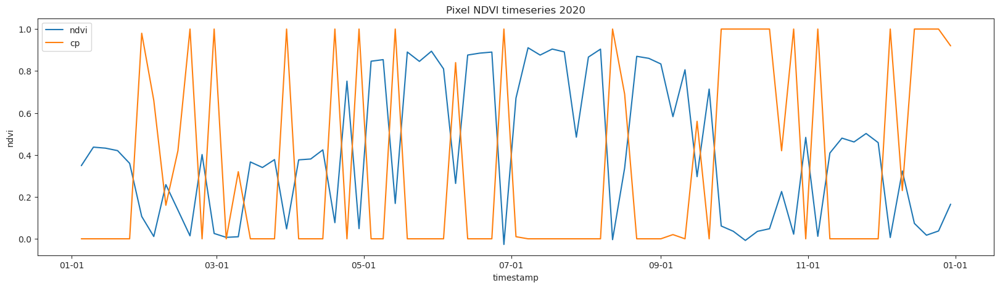

In [85]:
# BROADLEAVED PIXEL
coords = '46.000_7.02_46.372_7.435'
df_px1 = get_pixel_ndvi(coords, pix1)
df_px1['cp'] = df_px1['cp']/100


fig, ax = plt.subplots(1,1,figsize=(30,5))
sns.lineplot(ax=ax, data=df_px1, y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px1, y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2018], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2018], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2018')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2019], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2019], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2019')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2020], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px1[df_px1.timestamp.dt.year==2020], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2020')

Text(0.5, 1.0, 'Pixel NDVI timeseries 2020')

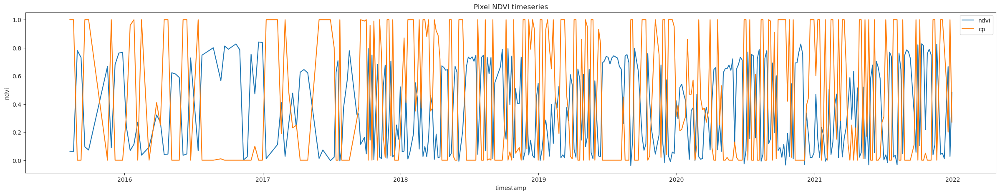

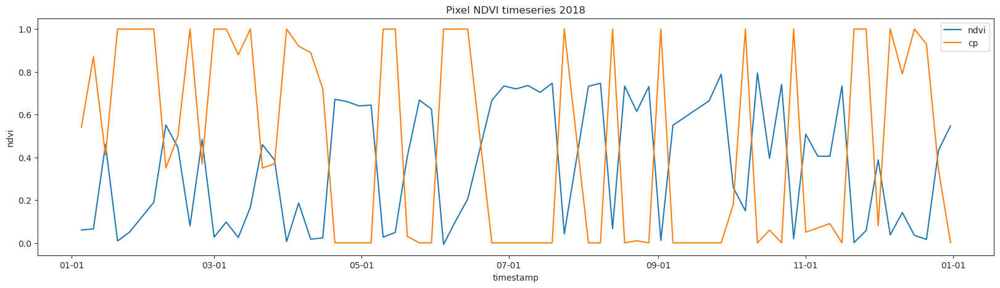

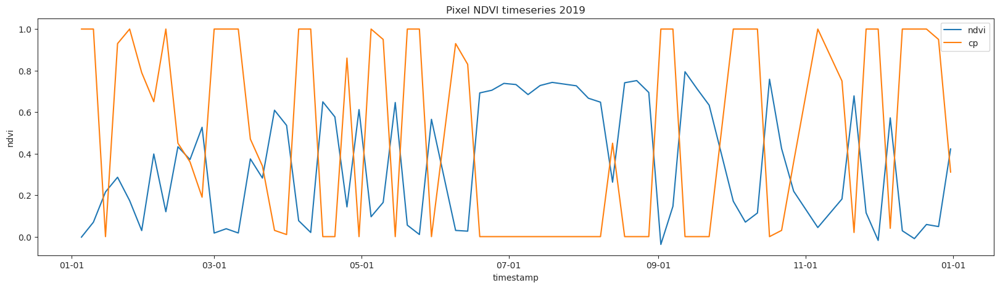

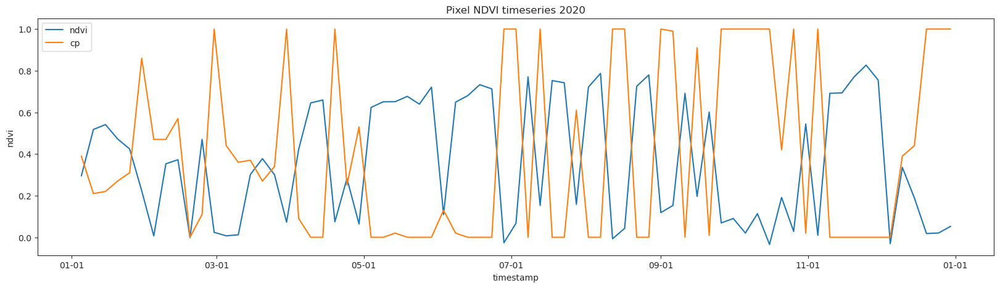

In [88]:
# CONIFEROUS PIXEL
coords = '46.000_7.02_46.372_7.435'
df_px2 = get_pixel_ndvi(coords, pix2)
df_px2['cp'] = df_px2['cp']/100


fig, ax = plt.subplots(1,1,figsize=(30,5))
sns.lineplot(ax=ax, data=df_px2, y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px2, y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2018], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2018], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2018')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2019], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2019], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2019')


fig, ax = plt.subplots(1,1,figsize=(20,5))
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2020], y='ndvi', x='timestamp', label='ndvi')
sns.lineplot(ax=ax, data=df_px2[df_px2.timestamp.dt.year==2020], y='cp', x='timestamp', label='cp')

sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Pixel NDVI timeseries 2020')

# 3. Mean seasonal cycle
- Focus on a region with low clouds (ex: Valais, https://www.meteoswiss.admin.ch/climate/the-climate-of-switzerland.html)
- Region also has to have had drought impacts, and be varied enough (topography…)
- Collect NDVI measurements, dropping data with cloud probability above a cloud threshold
- Calculate mean cycle over all years

In [2]:
# Define region for analysis: Valais' sunny region (MeteoSuisse) where drought occured (Brun)

bbox_valais = [7.087,46.1437,7.444,46.3078] # South facing slope between Martigny and Sion
bbox_valais2 = [7.244, 46.212, 7.3683,46.2778]
bbox_conifer = [7.264746, 46.24418, 7.284053, 46.256492]
bbox_broadleave = [7.247378, 46.233473, 7.25750,46.24977]

In [3]:
# CREATE FOREST MASK AND GET COORDINATES OF FOREST PIXELS

bbox = bbox_valais2
forest_threshold = 0.95 #ratio of forest per pixel

# Create forest mask --> Use the one in valais!
forest_mask = '/dccstor/cimf/drought_impact/downloads/forest_mask/46.000_7.02_46.372_7.435/Drought-Continuous forest mask-11_03_2022T00_00_00.tiff'
if bbox is not None:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
else:
    with rasterio.open(forest_mask) as src:
        im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1)

for_arr[for_arr==-9999] = np.nan

# Make binary mask keeping only pixels that are >50% forest
forest_binary = for_arr.copy()
forest_binary[np.isnan(forest_binary)]=0
forest_binary[forest_binary<forest_threshold]=0
forest_binary[forest_binary!=0]=1
forest_binary = (forest_binary==1)

# Get coordinates of forest pixel in bbox
with rasterio.open(forest_mask) as src:
    im_forest = rasterio.open(forest_mask)
    for_arr = im_forest.read(1,  window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))
    print('shape of bbox:', for_arr.shape)
    height = for_arr.shape[0]
    width = for_arr.shape[1]
    bbox_transform = rasterio.transform.from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], width, height)
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rasterio.transform.xy(bbox_transform, rows, cols)
    lons = np.concatenate(xs).ravel()
    lats = np.concatenate(ys).ravel()

# Select forest pixels
forest_indices = np.where(forest_binary.flatten() == True)
row_pixs = forest_indices[0]
col_pixs = forest_indices[0]
lons = lons[col_pixs]
lats = lats[row_pixs]

df_coords = pd.DataFrame({'lons':lons, 'lats': lats})

# Create point geometries
gdf = gpd.GeoDataFrame(df_coords, geometry=gpd.points_from_xy(df_coords['lons'], df_coords['lats']), crs="EPSG:4326")

shape of bbox: (257, 485)


### Dropping rates

In [5]:
def get_ndvi_cp(coords, cp_thresh, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Drop measurement if its proba is above 
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            for file in os.listdir(data_path + '/' + folder):

                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

            # Mask out forest, clouds and -9999 (as nan)
            cloud[cloud == -9999] = np.nan
            ndvi[ndvi == -9999] = np.nan
            ndvi[cloud>=cp_thresh] = np.nan
            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten()}) #, 'coords':gdf['geometry']})
            df_file = df_file.dropna(axis=0)

            df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [13]:
cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
num_data =  np.empty((len(cp_thresholds)))
coords = '46.000_7.02_46.372_7.435'

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp(coords, cp, forest_binary, bbox_valais2)
    #df_NDVI2 = get_ndvi_cp(coords, cp, forest_binary2, bbox_valais2)
    num_data[i] = len(df_NDVI) #+ len(df_NDVI2)

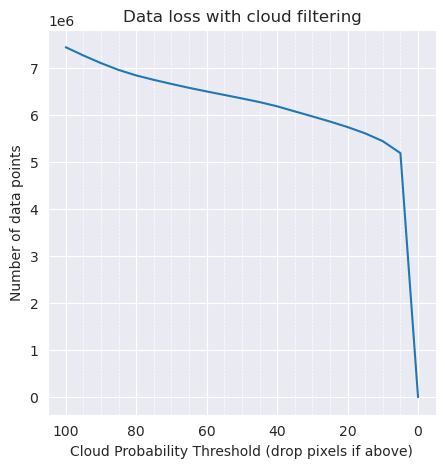

In [14]:
# Plot the change in data
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.lineplot(ax=ax, x=cp_thresholds, y=num_data)
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
sns.set_style("darkgrid")
plt.show()

In [15]:
# Compute change per year

cp_thresholds = [100,95,90,85,80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5,0]
cnt_per_yr = pd.DataFrame()
coords = '46.000_7.02_46.372_7.435'

for i, cp in enumerate(cp_thresholds):
    df_NDVI = get_ndvi_cp(coords, cp, forest_binary, bbox_valais2)
    #df_NDVI2 = get_ndvi_cp(coords, cp, forest_binary2, bbox_valais2)
    #df_NDVI = pd.concat([df_NDVI, df_NDVI2], axis=0, ignore_index=True)
    # Count per year
    gb_yr = df_NDVI.groupby(df_NDVI['timestamp'].map(lambda x: x.year)).count().ndvi.reset_index()
    # Add column for cp
    gb_yr['cp'] = [cp]*len(gb_yr)
    # Add to cnt_per_yr (append row wise)
    cnt_per_yr = pd.concat([cnt_per_yr, gb_yr], axis=0, ignore_index=True)
    
df_NDVI_tmp = get_ndvi_cp(coords, 10, forest_binary, bbox_valais2)
yrs = np.unique(df_NDVI_tmp['timestamp'].map(lambda x: x.year))
cnt_per_yr_0 = pd.DataFrame({'timestamp': yrs, 'ndvi':[0]*len(yrs), 'cp':[0]*len(yrs)})
cnt_per_yr =  pd.concat([cnt_per_yr, cnt_per_yr_0], axis=0, ignore_index=True)

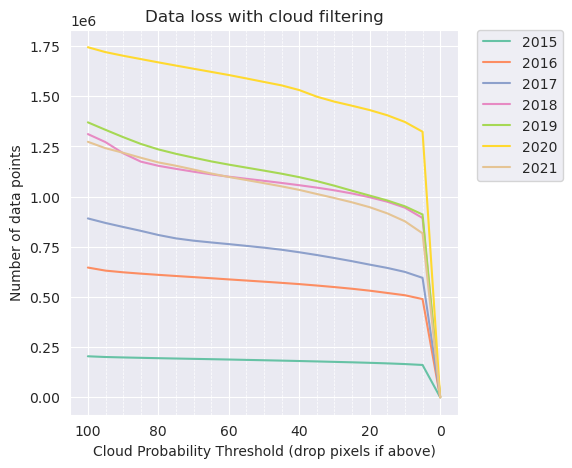

In [16]:
# Plot the change in data, per year
fig, ax = plt.subplots(1,1, figsize=(5,5))
sns.set_style("darkgrid")
sns.lineplot(ax=ax, x='cp', y='ndvi', hue='timestamp', data=cnt_per_yr, palette="Set2")
ax.set_xlabel('Cloud Probability Threshold (drop pixels if above)')
ax.set_ylabel('Number of data points')
ax.set_title('Data loss with cloud filtering')
sns.set_context(rc={"grid.linewidth": 0.8, "axes.edgecolor": "0.8"})
plt.gca().invert_xaxis()
ax.grid(which='minor', linestyle='--', linewidth=0.5, color='white')
ax.xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())
plt.grid(True, which='major')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

### Add tree type in forest mask gdf

#### Using cp=30

In [47]:
coords = '46.000_7.02_46.372_7.435'
cp_thresh = 30
#df_NDVI = get_ndvi_cp(coords, cp, forest_binary, bbox_valais)
#df_NDVI2 = get_ndvi_cp(coords, cp, forest_binary2, bbox_valais2)
#df_NDVI = pd.concat([df_NDVI, df_NDVI2], axis=0, ignore_index=True)
df_NDVI = get_ndvi_cp(coords, cp_thresh, forest_binary, bbox_conifer)
#df_NDVI = get_ndvi_cp(coords, cp_thresh, forest_binary, bbox_broadleave)

In [48]:
gb_day = df_NDVI.groupby('timestamp').mean().reset_index()
gb_day['dayofyear'] = gb_day['timestamp'].dt.dayofyear

Text(0.5, 1.0, 'Mean NDVI timeseries')

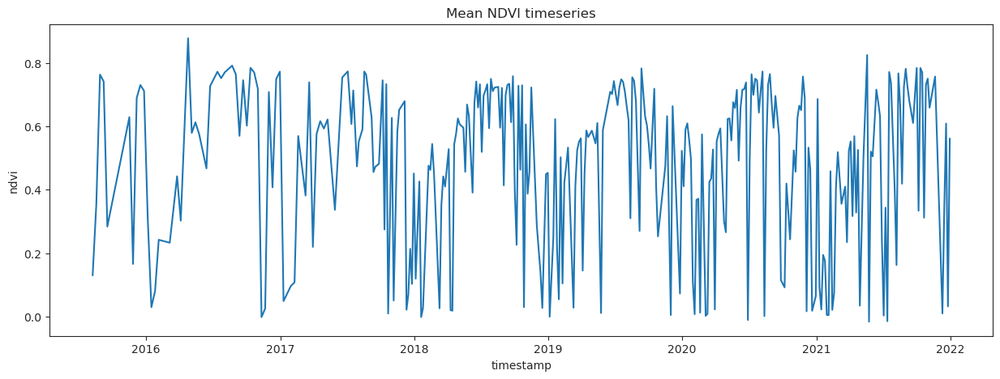

In [49]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='timestamp') #, errorbar=('sd'))
sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#ax.set_xticks()
plt.title('Mean NDVI timeseries')

Text(0.5, 1.0, 'Yearly mean NDVI timeseries')

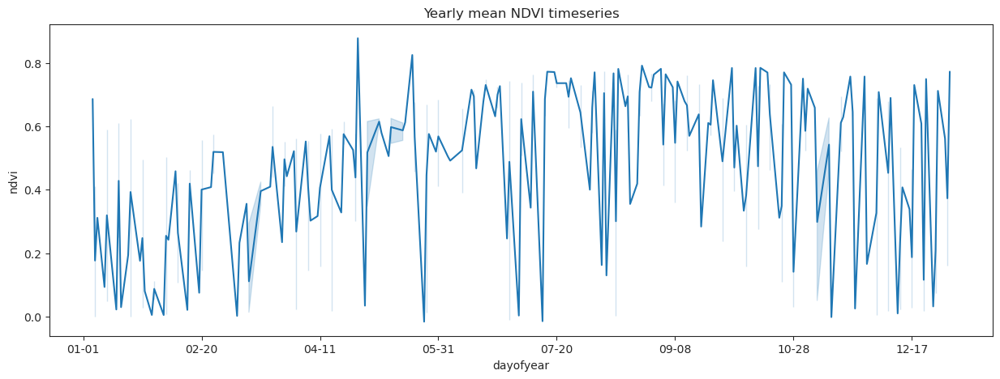

In [50]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='dayofyear') #, errorbar=('sd'))
sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
#ax.set_xticks()
plt.title('Yearly mean NDVI timeseries')

#### Using cp=10

In [16]:
coords = '46.000_7.02_46.372_7.435'
cp_thresh = 10
df_NDVI = get_ndvi_cp(coords, cp, forest_binary, bbox_valais)
df_NDVI2 = get_ndvi_cp(coords, cp, forest_binary2, bbox_valais2)
df_NDVI = pd.concat([df_NDVI, df_NDVI2], axis=0, ignore_index=True)

gb_day = df_NDVI.groupby('timestamp').mean().reset_index()
gb_day['dayofyear'] = gb_day['timestamp'].dt.dayofyear

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

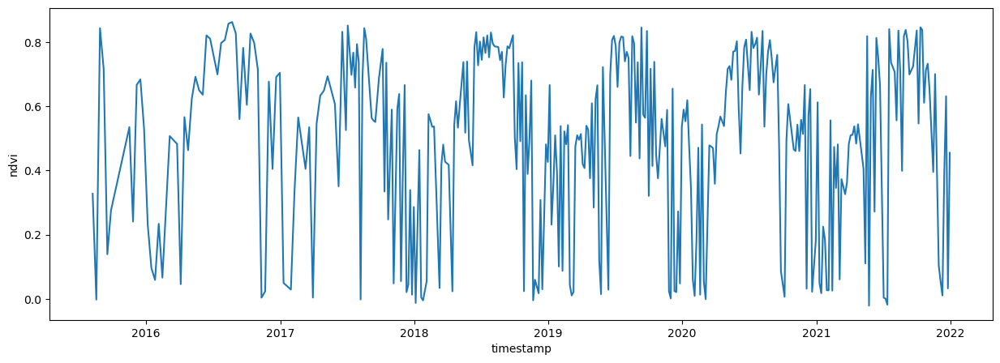

In [17]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='timestamp') #, errorbar=('sd'))

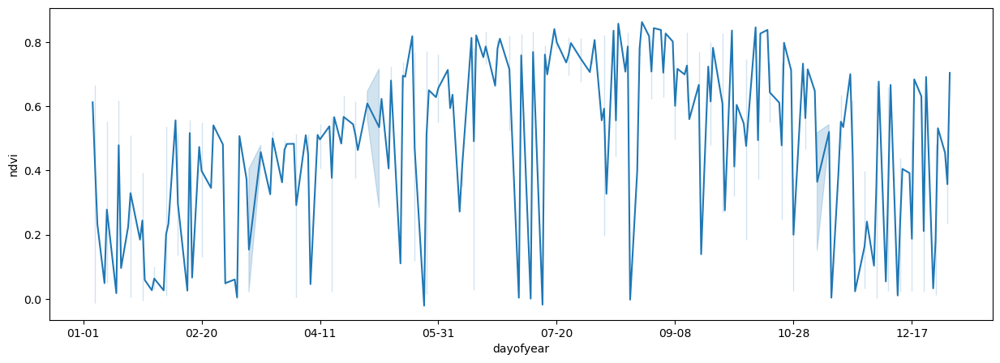

In [18]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='dayofyear') #, errorbar=('sd'))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
#ax.xaxis.set_major_locator(mdates.DayLocator(interval=15))

#### Using CP=5

In [57]:
coords = '46.000_7.02_46.372_7.435'
cp_thresh = 5
#df_NDVI = get_ndvi_cp(coords, cp, forest_binary, bbox_valais)
#df_NDVI2 = get_ndvi_cp(coords, cp, forest_binary2, bbox_valais2)
#df_NDVI = pd.concat([df_NDVI, df_NDVI2], axis=0, ignore_index=True)
#df_NDVI = get_ndvi_cp(coords, cp_thresh, forest_binary, bbox_conifer)
df_NDVI = get_ndvi_cp(coords, cp_thresh, forest_binary, bbox_broadleave)
gb_day = df_NDVI.groupby('timestamp').mean().reset_index()
gb_day['dayofyear'] = gb_day['timestamp'].dt.dayofyear

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

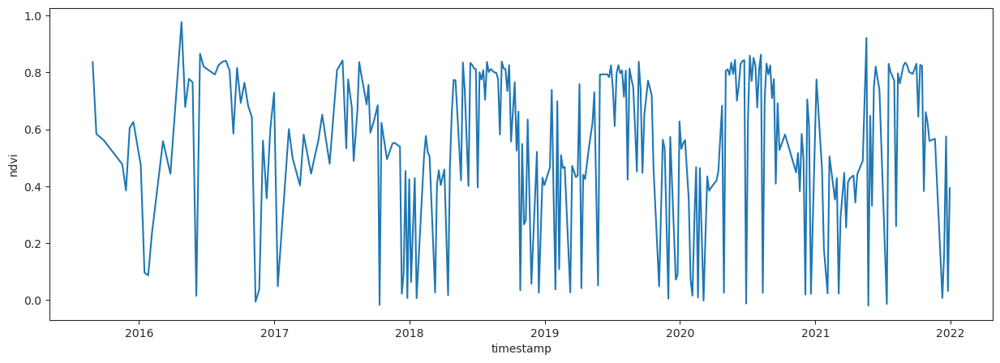

In [58]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='timestamp') #, errorbar=('sd'))

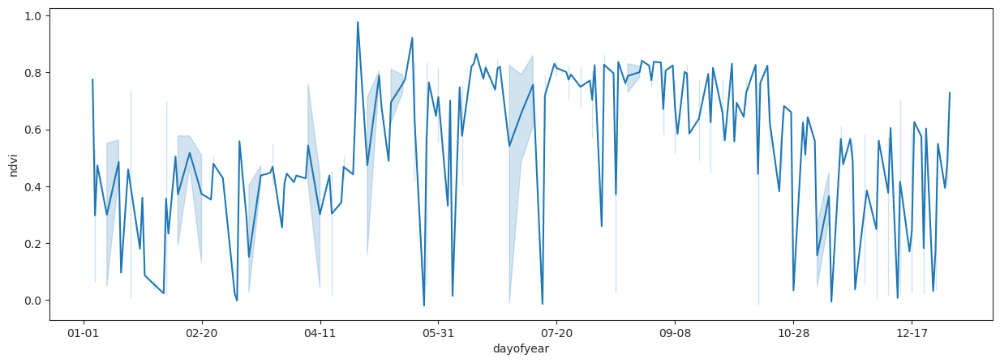

In [59]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='dayofyear') #, errorbar=('sd'))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
#ax.xaxis.set_major_locator(mdates.DayLocator(interval=15))

# Finding a general trend line
- <s>statsmodels.tsa.seasonal import seasonal_decompose </s>--> only deals with regular timeseries
- compute max in a rolling window
- savgol filter 
- fourier analysis
- interpolation
    - interpolate.interp1d
    - scipy.interpolate.BSpline: This method can be used for B-spline interpolation.
    - scipy.interpolate.Akima1DInterpolator : Akima interpolation, it is based on piecewise cubic polynomial
    - scipy.interpolate.PchipInterpolator : Pchip interpolation
    - scikit-learn.interpolate.Rbf : Radial basis function interpolation.

In [4]:
# CP>thresh instead of >=

def get_ndvi_cp(coords, cp_thresh, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Drop measurement if its proba is above 
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            for file in os.listdir(data_path + '/' + folder):

                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

            # Mask out forest, clouds and -9999 (as nan)
            cloud[cloud == -9999] = np.nan
            ndvi[ndvi == -9999] = np.nan
            ndvi[cloud>cp_thresh] = np.nan
            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten()}) #, 'coords':gdf['geometry']})
            df_file = df_file.dropna(axis=0)

            df_NDVI = pd.concat([df_NDVI, df_file], axis=0, ignore_index=True) 

    return df_NDVI

In [5]:
coords = '46.000_7.02_46.372_7.435'
cp_thresh = 0
df_NDVI = get_ndvi_cp(coords, cp_thresh, forest_binary, bbox_valais2)

In [6]:
# Count number of pixels per year
df_NDVI.groupby(df_NDVI['timestamp'].dt.year).ndvi.count().reset_index()

,timestamp,ndvi
0,2015,152069
1,2016,452614
2,2017,535845
3,2018,803699
4,2019,841541
5,2020,1218220
6,2021,727524


In [7]:
gb_day = df_NDVI.groupby('timestamp').mean().reset_index()
gb_day_med = df_NDVI.groupby('timestamp').median().reset_index()
gb_day['dayofyear'] = gb_day['timestamp'].dt.dayofyear

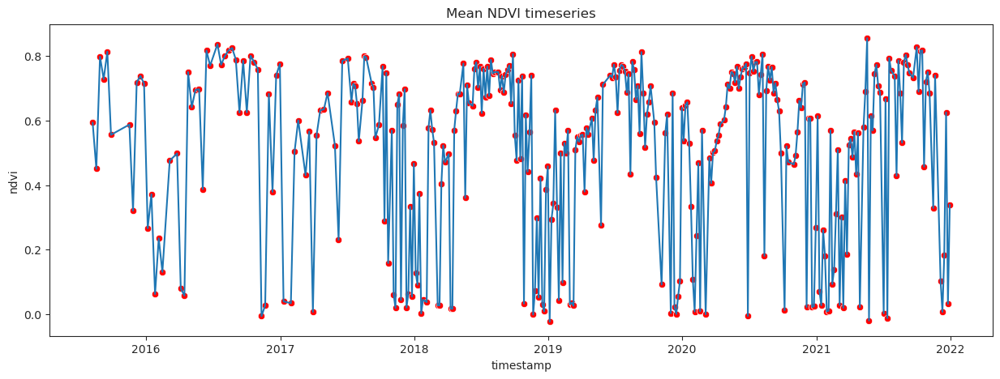

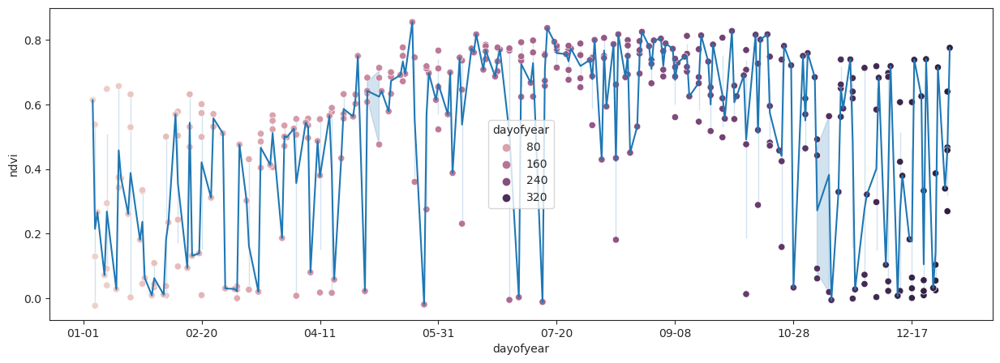

In [121]:
# MEAN SEASONAL CYCLE

fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='timestamp') 
sns.scatterplot(ax=ax,data=gb_day, y='ndvi', x='timestamp', color='red')
sns.set_style("ticks")
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#ax.set_xticks()
plt.title('Mean NDVI timeseries')

fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,data=gb_day, y='ndvi', x='dayofyear') #, errorbar=('sd'))
sns.scatterplot(ax=ax,data=gb_day, y='ndvi', x='dayofyear', hue='dayofyear')
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
#ax.xaxis.set_major_locator(mdates.DayLocator(interval=15))

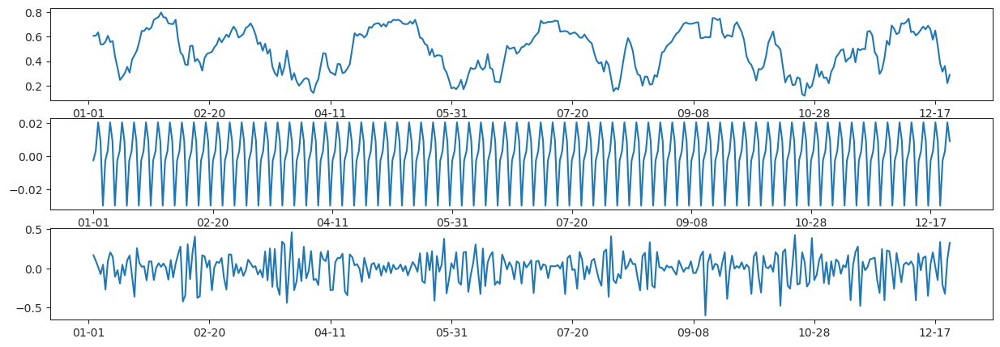

In [106]:
# SEASONAL DECOMPOSE
#from statsmodels.tsa.seasonal import seasonal_decompose

# period should match the number of time units per seasonal cycle in data
ndvi_decomp=seasonal_decompose(gb_day['ndvi'], model='additive', period=5) # roughly 10-daily data

# access the different components
trend = ndvi_decomp.trend
seasonal = ndvi_decomp.seasonal
residual = ndvi_decomp.resid

fig, axs = plt.subplots(3,1,figsize=(15,5))
axs[0].plot(trend)
axs[1].plot(seasonal)
axs[2].plot(residual)
axs[0].xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
axs[1].xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
axs[2].xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

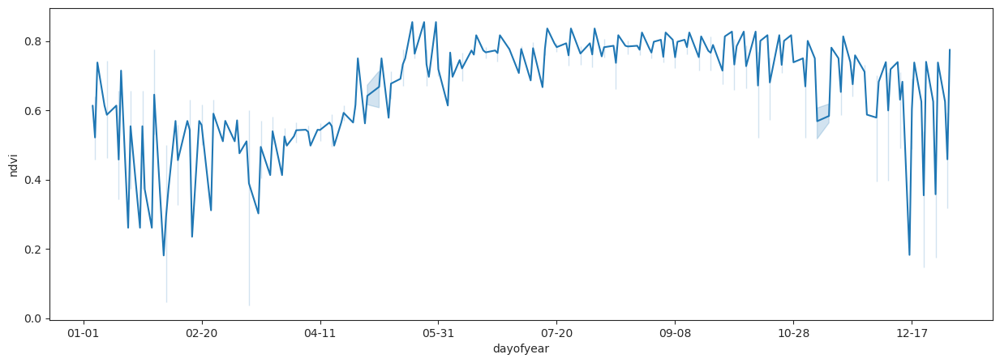

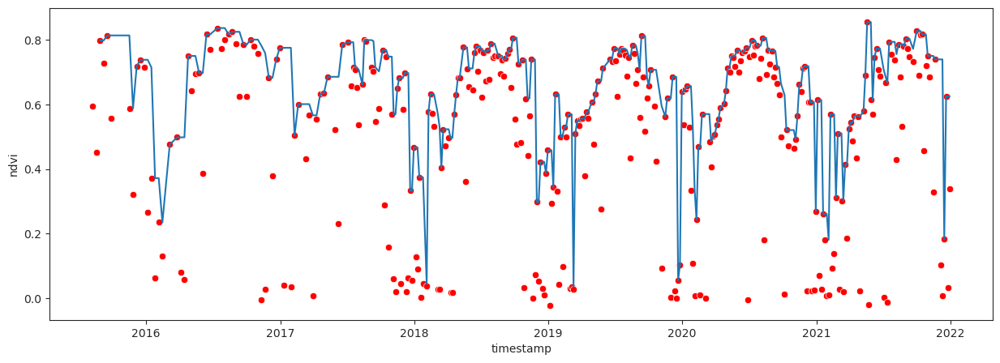

In [122]:
# MAX IN ROLLING WINDOW

# Create a rolling window 
window = gb_day.rolling(3)

# Find the maximum value in each window
max_values = window.ndvi.max()

fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax, y=max_values, x=gb_day['dayofyear']) 
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

fig, ax = plt.subplots(1,1,figsize=(15,5))
sns.lineplot(ax=ax,y=max_values, x=gb_day['timestamp']) #, errorbar=('sd'))
sns.scatterplot(y=gb_day.ndvi, x=gb_day.timestamp, color='red')

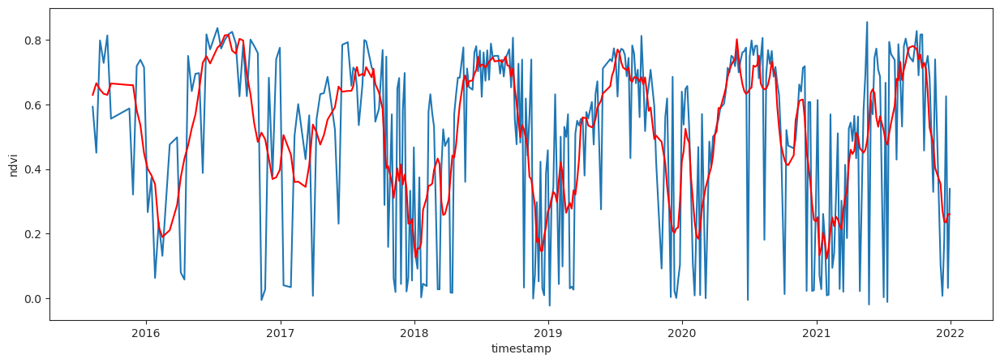

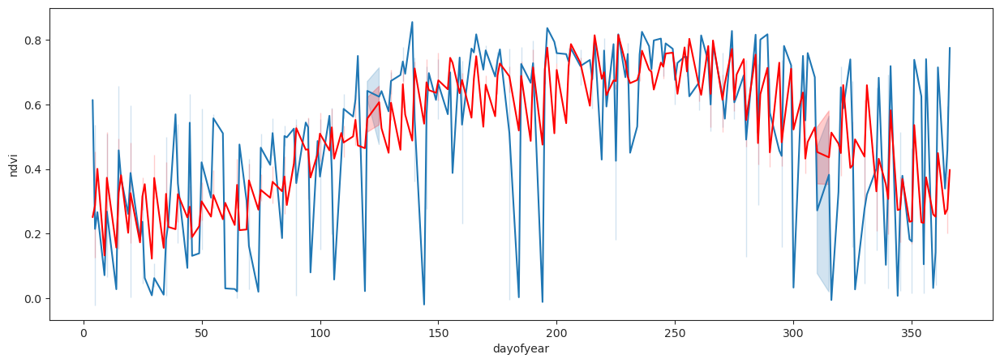

In [123]:
# SAVGOL FILTER

v_smooth = signal.savgol_filter(gb_day['ndvi'], window_length=13, polyorder=3, mode="nearest")

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.timestamp, y=gb_day.ndvi)
sns.lineplot(x=gb_day.timestamp, y=v_smooth, color='red')


fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.dayofyear, y=gb_day.ndvi)
sns.lineplot(x=gb_day.dayofyear, y=v_smooth, color='red')
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

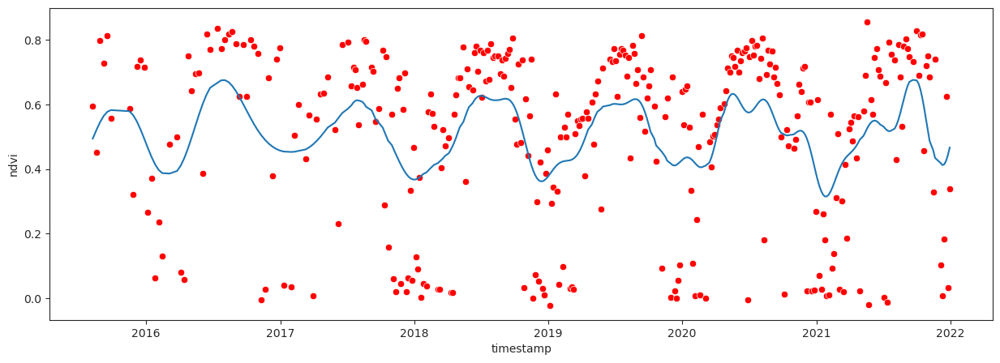

In [127]:
# FOURIER TRANSFORM

fourier_data = np.fft.fft(gb_day.ndvi)
# Filter out high-frequency components
fourier_data[20:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.timestamp, y=cleaned_data)
sns.scatterplot(y=gb_day.ndvi, x=gb_day.timestamp, color='red')


<AxesSubplot:xlabel='dayofyear', ylabel='ndvi'>

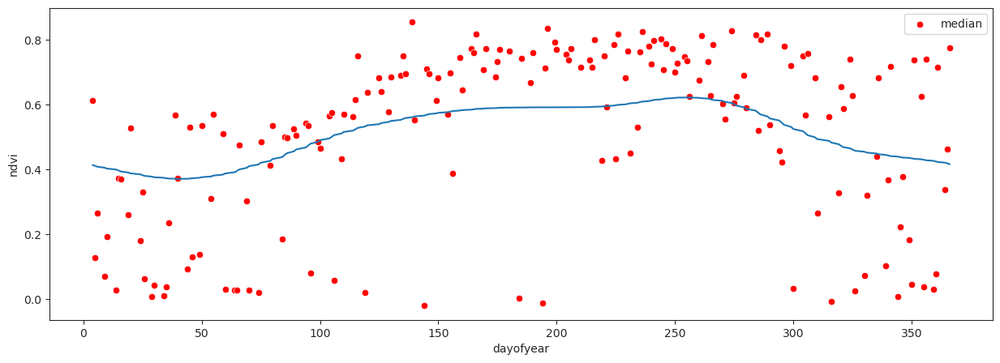

In [128]:
# FOURIER ANALYSIS ON MEDIAN OVER THE YEARS

median_ndvi = gb_day.groupby('dayofyear').median().ndvi.reset_index()
fourier_data = np.fft.fft(median_ndvi.ndvi)
# Filter out high-frequency components
fourier_data[5:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=median_ndvi.dayofyear, y=cleaned_data)
#sns.scatterplot(y=gb_day.ndvi, x=gb_day.dayofyear, color='red')
sns.scatterplot(x=median_ndvi.dayofyear, y=median_ndvi.ndvi, color='red', label="median")

<AxesSubplot:xlabel='dayofyear', ylabel='ndvi'>

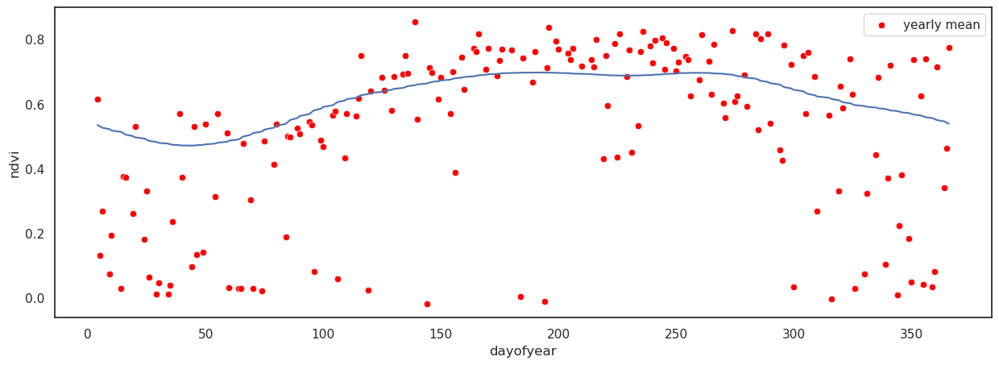

In [24]:
# FOURIER ANALYSIS ON MEDIAN OVER THE YEARS + ROLLING MAX
sns.set_theme(style="white")
median_ndvi = gb_day.groupby('dayofyear').median().ndvi.reset_index()

# Create a rolling window of size 3
window = median_ndvi.rolling(2)

# Find the maximum value in each window
max_values = window.ndvi.max().fillna(method='bfill').fillna(method='ffill')

fourier_data = np.fft.fft(max_values)
# Filter out high-frequency components
fourier_data[5:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=median_ndvi.dayofyear, y=cleaned_data)
#sns.lineplot(x=median_ndvi.dayofyear, y=max_values, color='pink', label='rolling max') #, errorbar=('sd'))
sns.scatterplot(x=median_ndvi.dayofyear, y=median_ndvi.ndvi, color='red', label='yearly mean')

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

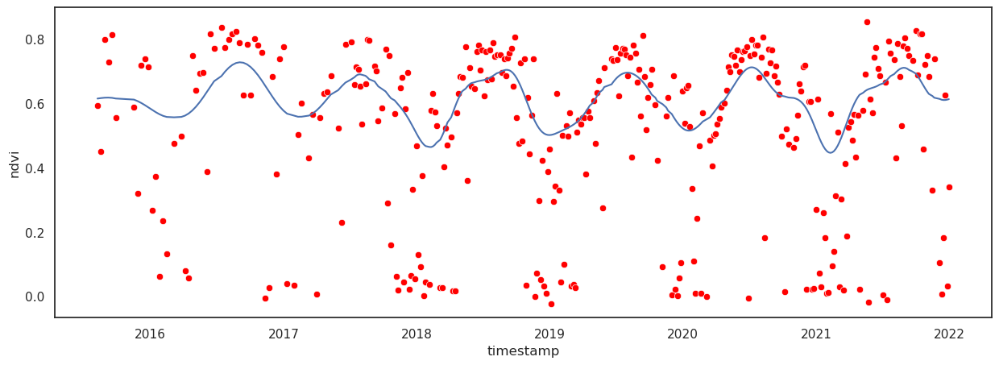

In [25]:
# MAX + FFT 

# Create a rolling window
window = gb_day.rolling(2)

# Find the maximum value in each window
max_values = window.ndvi.max().fillna(method='bfill').fillna(method='ffill')

fourier_data = np.fft.fft(max_values)
# Filter out high-frequency components
fourier_data[15:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.timestamp, y=cleaned_data)
sns.scatterplot(y=gb_day.ndvi, x=gb_day.timestamp, color='red')



<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

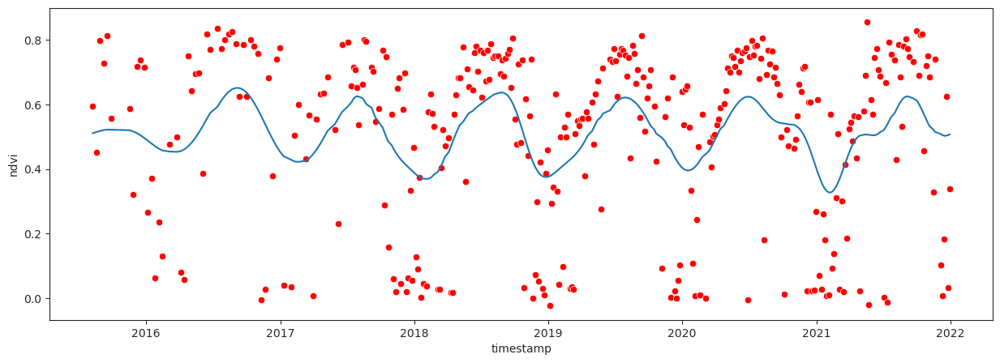

In [131]:
# ROLLING MEAN

# Create a rolling window of size 3
window = gb_day.rolling(3)

# Find the maximum value in each window
max_values = window.ndvi.mean().fillna(method='bfill').fillna(method='ffill')

fourier_data = np.fft.fft(max_values)
# Filter out high-frequency components
fourier_data[15:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.timestamp, y=cleaned_data)
sns.scatterplot(y=gb_day.ndvi, x=gb_day.timestamp, color='red')

In [ ]:
# MEAN AND FFT

# Create a rolling window of size 3
window = gb_day.rolling(2)

# Find the maximum value in each window
max_values = window.ndvi.max().fillna(method='bfill').fillna(method='ffill')

fourier_data = np.fft.fft(max_values)
# Filter out high-frequency components
fourier_data[15:] = 0
# Perform an inverse Fourier Transform to get the cleaned data
cleaned_data = np.fft.ifft(fourier_data)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=gb_day.timestamp, y=cleaned_data)
sns.scatterplot(y=gb_day.ndvi, x=gb_day.timestamp, color='red')

In [145]:
# SPLINE INTERPOLATION

from scipy.interpolate import CubicSpline

"""
x = pd.to_numeric(gb_day.timestamp)
y = gb_day.ndvi
df_new = pd.DataFrame({'reg_ts':pd.date_range(start="2015-08-09", end="2021-12-30", freq="D")}) # regular timeseries, with points we want to interpolate
x_new = pd.to_numeric(df_new.reg_ts)
ndvi_new = CubicSpline(x, y)
y_new = ndvi_new(x_new)
"""
 
# Fit spline to mean over the years
mean_ndvi = gb_day.groupby('dayofyear').mean().ndvi.reset_index()
#df_new = pd.DataFrame({'reg_ts':pd.date_range(start="2015-08-09", end="2021-12-30", freq="D")}) # regular timeseries, with points we want to interpolate
ndvi_new = CubicSpline(mean_ndvi.dayofyear, mean_ndvi.ndvi, bc_type=((1, 0.0), (1, 0.0)))
x_new = np.arange(1,365,1)
y_new = ndvi_new(x_new)

(-0.5, 1.5)

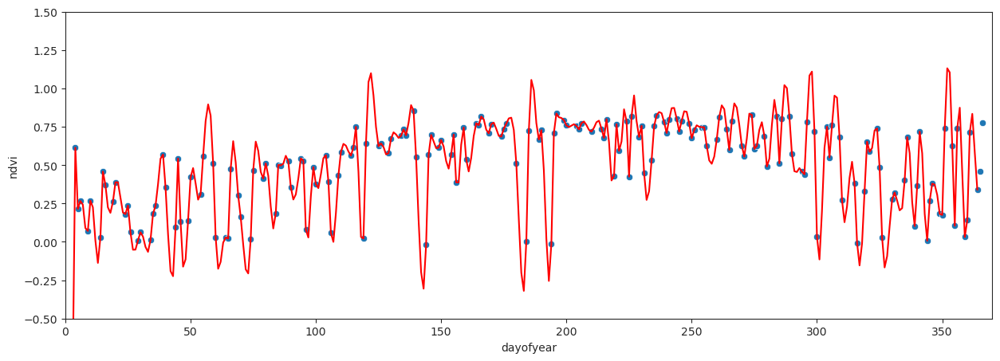

In [149]:
"""
fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=df_new.reg_ts, y=y_new)
#sns.lineplot(x=gb_day.timestamp, y=y,)
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
"""
fig, axs = plt.subplots(figsize=(15, 5))
sns.scatterplot(x=mean_ndvi.dayofyear, y=mean_ndvi.ndvi)
sns.lineplot(x=x_new, y=y_new, color='red')
axs.set_xlim(0, 370)
axs.set_ylim(-0.5, 1.5)
#ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

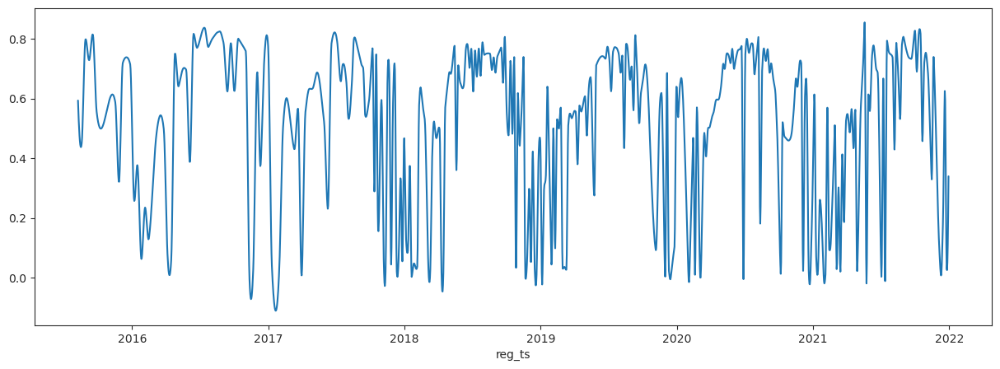

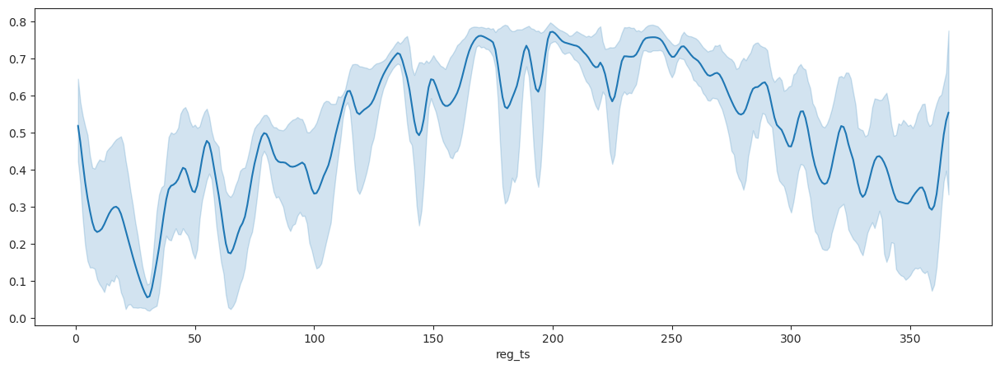

In [134]:
# AKIMA INTERPOLATION

from scipy.interpolate import Akima1DInterpolator

x = pd.to_numeric(gb_day.timestamp)
y = gb_day.ndvi
df_new = pd.DataFrame({'reg_ts':pd.date_range(start="2015-08-09", end="2021-12-30", freq="D")}) # regular timeseries, with points we want to interpolate
x_new = pd.to_numeric(df_new.reg_ts)
ndvi_new = Akima1DInterpolator(x, y)
y_new = ndvi_new(x_new)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=df_new.reg_ts, y=y_new)
#sns.lineplot(x=gb_day.timestamp, y=y,)
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=df_new.reg_ts.dt.dayofyear, y=y_new)
#sns.lineplot(x=gb_day.timestamp, y=y,)
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

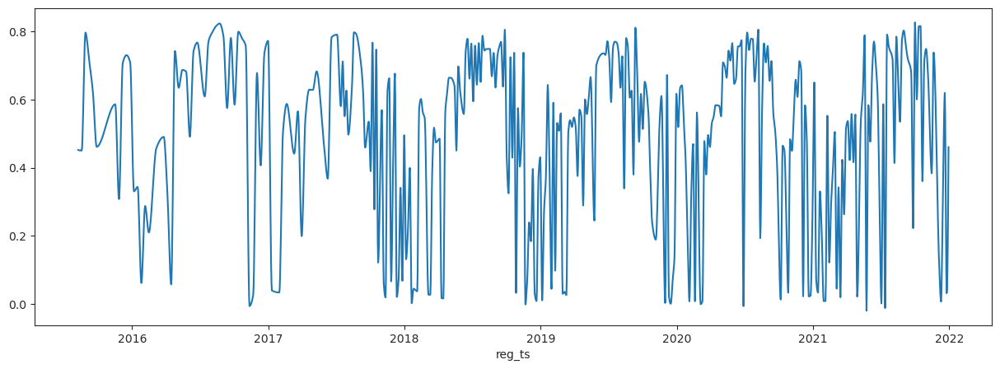

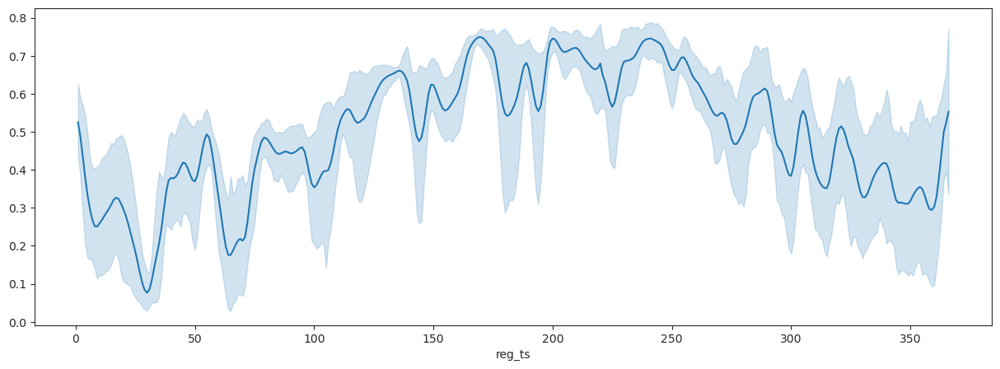

In [154]:
# PCHIP INTERPOLATION

from scipy.interpolate import PchipInterpolator

x = pd.to_numeric(gb_day.timestamp)
y = gb_day.ndvi
df_new = pd.DataFrame({'reg_ts':pd.date_range(start="2015-08-09", end="2021-12-30", freq="D")}) # regular timeseries, with points we want to interpolate
x_new = pd.to_numeric(df_new.reg_ts)
ndvi_new = PchipInterpolator(x, y)
y_new = ndvi_new(x_new)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=df_new.reg_ts, y=y_new)
#sns.lineplot(x=gb_day.timestamp, y=y,)
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=df_new.reg_ts.dt.dayofyear, y=y_new)
#sns.lineplot(x=gb_day.timestamp, y=y,)
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))

<AxesSubplot:xlabel='dayofyear', ylabel='dayofyear'>

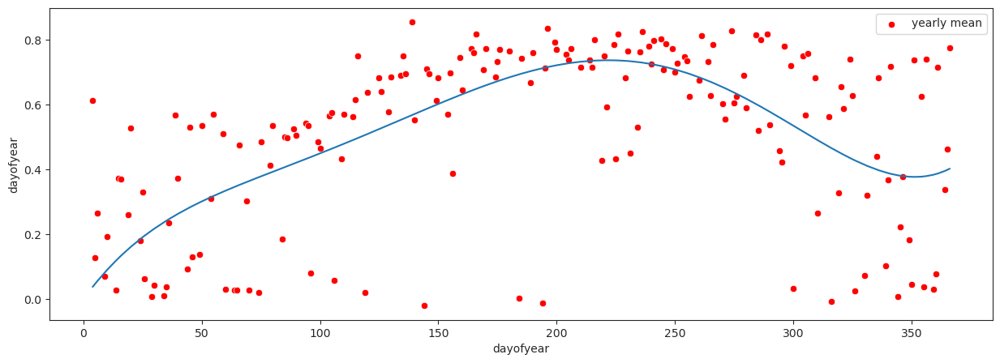

In [135]:
# FITITNG A CUBIC FUNCTION

from scipy.optimize import curve_fit

# Define the cubic function to fit
def cubic(x, a, b, c, d, e, f):
    #return a*x**3 + b*x**2 + c*x + d
    return a*x**5 + b*x**4 + c*x**3 + d*x**2 + e*x +d
# Provide an initial guess for the parameters
p0 = [1, -1, -1, -1, -1, 0]


median_ndvi = gb_day.groupby('dayofyear').median().ndvi.reset_index()

# Fit the function to the data
popt, pcov = curve_fit(f=cubic, p0=p0, ydata=median_ndvi.ndvi, xdata=median_ndvi.dayofyear)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=median_ndvi.dayofyear, y=cubic(median_ndvi.dayofyear, *popt))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
sns.scatterplot(x=median_ndvi.dayofyear, y=median_ndvi.ndvi, color='red', label='yearly mean')

[0.54653143 0.00741833 0.12315388]


<AxesSubplot:xlabel='dayofyear', ylabel='dayofyear'>

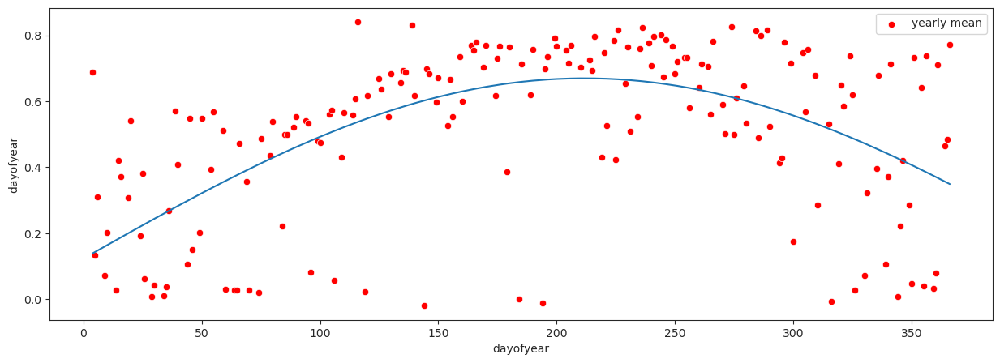

In [280]:
# FITITNG A SINUSOIDAL FUNCTION

from scipy.optimize import curve_fit

# Define the cubic function to fit
def sinusoidal(x, a, b, c):
    return a*np.sin(b*x) + c

# Provide an initial guess for the parameters
p0 = [1, 0.01, 0]


median_ndvi = gb_day.groupby('dayofyear').median().ndvi.reset_index()

# Fit the function to the data
popt, pcov = curve_fit(f=sinusoidal, p0=p0, ydata=median_ndvi.ndvi, xdata=median_ndvi.dayofyear)
print(popt)

fig, axs = plt.subplots(figsize=(15, 5))
sns.lineplot(x=median_ndvi.dayofyear, y=sinusoidal(median_ndvi.dayofyear, *popt))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
sns.scatterplot(x=median_ndvi.dayofyear, y=median_ndvi.ndvi, color='red', label='yearly mean')

<AxesSubplot:xlabel='timestamp', ylabel='ndvi'>

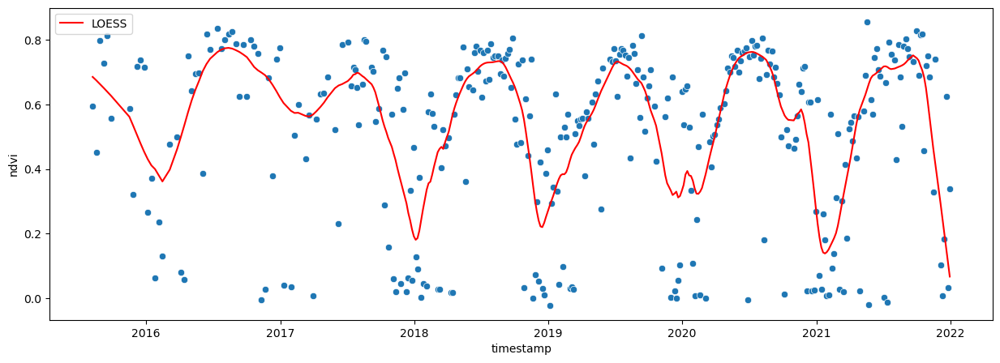

In [15]:
# LOESS SMOOTHING

from statsmodels.nonparametric.smoothers_lowess import lowess

smooth = lowess(gb_day.ndvi, gb_day.timestamp, frac=0.05)


fig, axs = plt.subplots(figsize=(15, 5))
#sns.lineplot(x=median_ndvi.dayofyear, y=sinusoidal(median_ndvi.dayofyear, *popt))
#ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
sns.scatterplot(x=gb_day.timestamp, y=gb_day.ndvi)
sns.lineplot(x=gb_day.timestamp, y=smooth[:, 1], color='red', label='LOESS')
# Plot the smoothed line

<AxesSubplot:xlabel='dayofyear', ylabel='ndvi'>

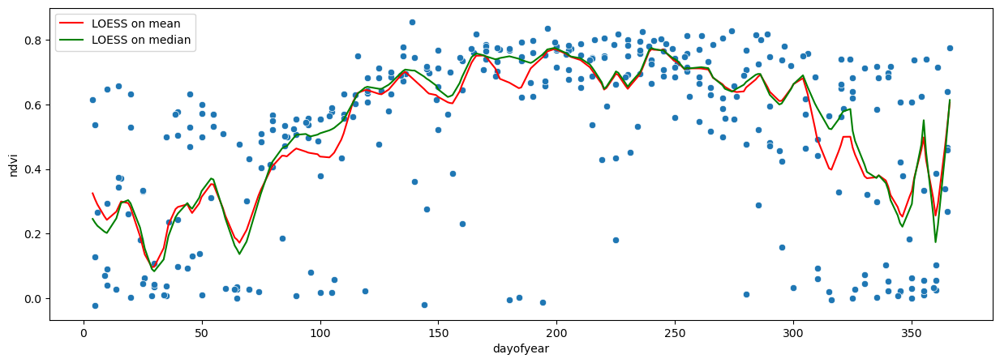

In [20]:
# LOESS SMOOTHING ON YEARLY MEAN AND MEDIAN

from statsmodels.nonparametric.smoothers_lowess import lowess


median_ndvi = gb_day.groupby('dayofyear').median().ndvi.reset_index()
mean_ndvi = gb_day.groupby('dayofyear').mean().ndvi.reset_index()
smooth_med = lowess(median_ndvi.ndvi, median_ndvi.dayofyear, frac=0.05)
smooth_mean = lowess(mean_ndvi.ndvi, mean_ndvi.dayofyear, frac=0.05)


fig, axs = plt.subplots(figsize=(15, 5))
#sns.lineplot(x=median_ndvi.dayofyear, y=sinusoidal(median_ndvi.dayofyear, *popt))
#ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
sns.scatterplot(x=gb_day.dayofyear, y=gb_day.ndvi)
sns.lineplot(x=mean_ndvi.dayofyear, y=smooth_mean[:, 1], color='red', label='LOESS on mean')
sns.lineplot(x=median_ndvi.dayofyear, y=smooth_med[:, 1], color='green', label='LOESS on median')

### NDVI cleaning function
- get the Ndvi timeseries of only 1 forest pixel in Valais
- plot raw
- plot cloud dorpped
- plot with added values from geenral series

In [163]:
def get_ndvi_cp_pixel(coords, cp_thresh, forest_binary, bbox):
    """
    Get NDVI pixels in bounding box if cloud proba < cp_thresh, sampling only forest pixels using the firet mask
    :param coords: coords of Valais patch to filter folders
    :param cp_thresh: cloud proba threshold. Drop measurement if its proba is above 
    :param gdf: GeoDataFrae containing cooridnates of all forest pixels in bbox
    :param forest_binary: forest mask
    :param bbox: boudning box to read data from
    """
    
    data_path = '/dccstor/cimf/drought_impact/downloads/SENTINEL 2'
    df_NDVI = pd.DataFrame()

    for folder in os.listdir(data_path):
        if coords in folder:
            timestamp = datetime.strptime(folder.split('Z')[0], '%Y-%m-%dT%H:%M:%S')
            for file in os.listdir(data_path + '/' + folder):

                ndvi_search = '\[' +  'NDVI' + '\]'
                CP_search = '\[' +  'CP' + '\]'

                if (file.endswith('.tiff') & bool(re.search(f'{ndvi_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        ndvi = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

                if (file.endswith('.tiff') & bool(re.search(f'{CP_search}',file))): 
                    with rasterio.open(data_path + '/' + folder + '/' + file) as src:
                        cloud = src.read(1, window=from_bounds(bbox[0], bbox[1], bbox[2], bbox[3], src.transform))

            # Mask out forest, clouds and -9999 (as nan)
            cloud[cloud == -9999] = np.nan
            ndvi[ndvi == -9999] = np.nan
            ndvi[cloud>=cp_thresh] = np.nan
            df_file = pd.DataFrame({'timestamp': [timestamp]*len(ndvi[forest_binary].flatten()), 'ndvi': ndvi[forest_binary].flatten(), 'cp':cloud[forest_binary].flatten()}) #, 'coords':gdf['geometry']})
            
            # Keep only first pixel
            df_NDVI = pd.concat([df_NDVI, df_file.head(1)], axis=0, ignore_index=True) 

    return df_NDVI

In [164]:
cp_thresh = 0
coords = coords = '46.000_7.02_46.372_7.435'
df_pixel_raw = get_ndvi_cp_pixel(coords, cp_thresh, forest_binary, bbox_valais2)

In [165]:
cp_thresh = 30
coords = coords = '46.000_7.02_46.372_7.435'
df_pixel_cp30 = get_ndvi_cp_pixel(coords, cp_thresh, forest_binary, bbox_valais2)